In [1]:
import torch 
import gc
from torch import nn 
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models
from torchsummary import summary
from torch.optim import AdamW, Adam, RMSprop, Adagrad 
from torchvision.io import read_image, ImageReadMode

import pandas as pd 
from datetime import datetime
import os 
import cv2
from PIL import Image, UnidentifiedImageError
import numpy as np
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pyplot as plt
from tqdm import tqdm 

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr


In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [4]:
device

'cuda'

In [5]:
rgb_transformer = transforms.Compose([
    transforms.Resize((384, 384)),
    transforms.ToTensor()
    
])

# will return: rgb_grayscaled, rgb_colorized for training embedding extraction model
class RGBDataset(Dataset):
    def __init__(self, data, transformer=None):
        self.data = data
        self.data_list = sorted(os.listdir(self.data))
        self.transformer = transformer
    def __len__(self):
        return len(self.data_list)
    def __getitem__(self, idx):
        data_link = os.path.join(self.data, self.data_list[idx])
        gray_img = Image.open(data_link).convert("L").convert("RGB")
        rgb_img = Image.open(data_link).convert("RGB")

        if self.transformer:
            gray_img = self.transformer(gray_img)
            rgb_img = self.transformer(rgb_img)

        return gray_img, rgb_img

In [6]:
# prepare data for embedding extraction

data = "/kaggle/input/historical-photos-7/data_05"
rgb_dataset = RGBDataset(data, rgb_transformer)

train_rgb_dataset, val_rgb_dataset = random_split(rgb_dataset, [0.9, 0.1])

train_rgb_dl = DataLoader(train_rgb_dataset, batch_size=64, generator=torch.Generator(device="cpu"))
val_rgb_dl = DataLoader(val_rgb_dataset, batch_size=64, generator=torch.Generator(device="cpu"))

In [7]:
# embedding extractor model

class SEBlock(nn.Module):
    def __init__(self, C, r=16):
        super().__init__()
        
        self.aap = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()
        
        self.linear1 = nn.Linear(C, C//r)
        self.linear2 = nn.Linear(C//r, C)
        
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        out = self.aap(x)
        out = self.flatten(out)
        
        out = self.relu(self.linear1(out))
        out = self.sigmoid(self.linear2(out))
        
        out = out[:, :, None, None]
        
        res = out * x
        return res



class SE_ResBlock(nn.Module):
    def __init__(self, inputs, outputs, kernel, stride, padding):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.ConvTranspose2d(inputs, outputs, kernel_size=kernel, stride=stride, padding=padding),
            nn.BatchNorm2d(outputs),
        )
        
        self.conv2 = nn.Sequential(
            nn.ConvTranspose2d(outputs, outputs, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(outputs),
        )
        
        
        self.add_conv = nn.Sequential(
                nn.ConvTranspose2d(inputs, outputs, kernel_size=kernel, stride=stride, padding=padding),
                nn.BatchNorm2d(outputs),
        )
            
        self.se_block = SEBlock(outputs)
    
        
        
    def forward(self, x):
        out = self.conv1(x)
        add_out = self.add_conv(x)
        
        out = F.leaky_relu(out)
        out = self.conv2(out)
        out = self.se_block(out)
        
        out += add_out
        
        out = F.leaky_relu(out)
        
        return out


class EmbeddingExtractor(nn.Module):
    def __init__(self, embedding_dim=2048):
        super().__init__()
        # self.swin = models.swin_t(pretrained=True)  
        # self.swin.head = nn.Linear(768, embedding_dim)  

        self.basic_model = models.inception_v3(pretrained=True, aux_logits=True)
        # self.basic_model.AuxLogits = None

        num_features = self.basic_model.fc.in_features 
        self.basic_model.fc = nn.Identity()

        self.linear = nn.Linear(num_features, 1024)
        self.conv1 = SE_ResBlock(1024, 512, kernel=4, stride=2, padding=1)

        self.conv2 = SE_ResBlock(512, 256, kernel=4, stride=2, padding=1)

        self.conv3 = SE_ResBlock(256, 256, kernel=4, stride=2, padding=1)

        self.conv4 = SE_ResBlock(256, 128, kernel=4, stride=2, padding=1)

        self.conv5 = SE_ResBlock(128, 64, kernel=4, stride=2, padding=1)

        self.conv6 = SE_ResBlock(64, 32, kernel=5, stride=3, padding=1)

        self.conv7 = SE_ResBlock(32, 16, kernel=4, stride=2, padding=1)

        self.conv8 = SE_ResBlock(16, 8, kernel=4, stride=2, padding=0)

        self.conv9 = nn.Conv2d(8, 3, kernel_size=3, stride=1, padding=0)
        
    def forward(self, x, return_emb=False):
        out = self.basic_model(x)
        # out = out.logits
        
        if isinstance(out, tuple):
            out = out.logits
        
        if return_emb == True:
            return out

        # print(out.shape)
        out = F.leaky_relu(self.linear(out))
        # print(out.shape)
        # out = out.view(x.size(0), 1024, 1, 1)
        out = out.unsqueeze(2).unsqueeze(3)
        # print(x.shape)
        out = self.conv1(out)
        # print(x.shape)
        out = self.conv2(out)
        # print(x.shape)
        out = self.conv3(out)
        # print(x.shape)
        out = self.conv4(out)
        # print(x.shape)
        out = self.conv5(out)
        # print(x.shape)
        out = self.conv6(out)
        # print(x.shape)
        out = self.conv7(out)
        # print(x.shape)
        out = self.conv8(out)
        out = F.sigmoid(self.conv9(out))

        return out

In [8]:
extractor = EmbeddingExtractor()
extractor.to(device)

dummy_image = torch.randn(1, 3, 384, 384).to(device)
embedding = extractor(dummy_image, return_emb=False)
embedding.shape

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 232MB/s] 
/usr/local/lib/python3.10/dist-packages/torch/nn/init.py:511: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element 

torch.Size([1, 3, 384, 384])

In [9]:
extractor = EmbeddingExtractor()
extractor.to(device)

dummy_image = torch.randn(1, 3, 384, 384).to(device)
embedding = extractor(dummy_image)
print(embedding.shape) 
embedding = extractor(dummy_image, return_emb=True)
print(embedding.shape) 

for param in extractor.basic_model.parameters():
    param.requires_grad = False

for param in extractor.basic_model.fc.parameters():
    param.requires_grad = True


torch.Size([1, 3, 384, 384])
torch.Size([1, 2048])


In [41]:
optimizer = Adam(filter(lambda p: p.requires_grad, extractor.parameters()), lr=1e-3)

loss_fn = nn.MSELoss()

In [42]:
def emb_train(train_dl, val_dl, emb_extractor, epochs, device, loss_fn, optimizer):
    hisrory = {
        'train_loss': [],
        'val_loss': []
    }
    for epoch in range(epochs):
        
        train_loss = 0.0
        emb_extractor.train()
        
        for gray, rgb in tqdm(train_dl):
            gray = gray.to(device)
            rgb = rgb.to(device)
            
            reconstructed_rgb = emb_extractor(gray)
            loss = loss_fn(reconstructed_rgb, rgb)
            train_loss += loss.item()
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
        val_loss = 0.0 
        emb_extractor.eval()

        
        with torch.no_grad():
            
            for gray, rgb in tqdm(val_dl):
                gray = gray.to(device)
                rgb = rgb.to(device)
                
                reconstructed_rgb = emb_extractor(gray)
                loss = loss_fn(reconstructed_rgb, rgb)
                val_loss += loss.item()
            
            
        train_loss /= len(train_dl)
        val_loss /= len(val_dl)
        
        hisrory["train_loss"].append(train_loss)
        hisrory["val_loss"].append(val_loss)
        print(f"Epoch: {epoch+1}; train_loss: {train_loss:.4f}; val_loss: {val_loss:.4f}")
        
    return hisrory
        

In [184]:
x, y = next(iter(train_rgb_dl))
x.shape, y.shape

x, y = next(iter(val_rgb_dl))
x.shape, y.shape

(torch.Size([64, 3, 384, 384]), torch.Size([64, 3, 384, 384]))

In [43]:
history = emb_train(train_rgb_dl, val_rgb_dl, extractor, 40, device, loss_fn, optimizer)

100%|██████████| 20/20 [00:56<00:00,  2.84s/it]


Epoch: 1; train_loss: 0.0660; val_loss: 0.0591


100%|██████████| 20/20 [00:46<00:00,  2.33s/it]


Epoch: 2; train_loss: 0.0593; val_loss: 0.0557


100%|██████████| 20/20 [00:46<00:00,  2.31s/it]


Epoch: 3; train_loss: 0.0566; val_loss: 0.0531


100%|██████████| 20/20 [00:44<00:00,  2.24s/it]


Epoch: 4; train_loss: 0.0546; val_loss: 0.0502


100%|██████████| 20/20 [00:45<00:00,  2.28s/it]


Epoch: 5; train_loss: 0.0527; val_loss: 0.0494


100%|██████████| 20/20 [00:44<00:00,  2.24s/it]


Epoch: 6; train_loss: 0.0513; val_loss: 0.0468


100%|██████████| 20/20 [00:45<00:00,  2.29s/it]


Epoch: 7; train_loss: 0.0496; val_loss: 0.0456


100%|██████████| 20/20 [00:46<00:00,  2.30s/it]


Epoch: 8; train_loss: 0.0480; val_loss: 0.0444


100%|██████████| 20/20 [00:45<00:00,  2.29s/it]


Epoch: 9; train_loss: 0.0467; val_loss: 0.0430


100%|██████████| 20/20 [00:45<00:00,  2.28s/it]


Epoch: 10; train_loss: 0.0454; val_loss: 0.0417


100%|██████████| 20/20 [00:45<00:00,  2.28s/it]


Epoch: 11; train_loss: 0.0439; val_loss: 0.0402


100%|██████████| 20/20 [00:46<00:00,  2.35s/it]


Epoch: 12; train_loss: 0.0426; val_loss: 0.0385


100%|██████████| 20/20 [00:46<00:00,  2.32s/it]


Epoch: 13; train_loss: 0.0413; val_loss: 0.0373


100%|██████████| 20/20 [00:45<00:00,  2.29s/it]


Epoch: 14; train_loss: 0.0397; val_loss: 0.0362


100%|██████████| 20/20 [00:45<00:00,  2.29s/it]


Epoch: 15; train_loss: 0.0384; val_loss: 0.0348


100%|██████████| 20/20 [00:45<00:00,  2.29s/it]


Epoch: 16; train_loss: 0.0370; val_loss: 0.0333


100%|██████████| 20/20 [00:45<00:00,  2.30s/it]


Epoch: 17; train_loss: 0.0358; val_loss: 0.0321


100%|██████████| 20/20 [00:46<00:00,  2.31s/it]


Epoch: 18; train_loss: 0.0346; val_loss: 0.0312


100%|██████████| 20/20 [00:47<00:00,  2.37s/it]


Epoch: 19; train_loss: 0.0335; val_loss: 0.0306


100%|██████████| 20/20 [00:47<00:00,  2.37s/it]


Epoch: 20; train_loss: 0.0324; val_loss: 0.0296


100%|██████████| 20/20 [00:46<00:00,  2.33s/it]


Epoch: 21; train_loss: 0.0312; val_loss: 0.0287


100%|██████████| 20/20 [00:46<00:00,  2.33s/it]


Epoch: 22; train_loss: 0.0304; val_loss: 0.0279


100%|██████████| 20/20 [00:46<00:00,  2.33s/it]


Epoch: 23; train_loss: 0.0296; val_loss: 0.0276


100%|██████████| 20/20 [00:46<00:00,  2.32s/it]


Epoch: 24; train_loss: 0.0286; val_loss: 0.0269


100%|██████████| 20/20 [00:46<00:00,  2.30s/it]


Epoch: 25; train_loss: 0.0279; val_loss: 0.0264


100%|██████████| 20/20 [00:46<00:00,  2.30s/it]


Epoch: 26; train_loss: 0.0273; val_loss: 0.0256


100%|██████████| 20/20 [00:46<00:00,  2.31s/it]


Epoch: 27; train_loss: 0.0265; val_loss: 0.0254


100%|██████████| 20/20 [00:46<00:00,  2.32s/it]


Epoch: 28; train_loss: 0.0259; val_loss: 0.0250


100%|██████████| 20/20 [00:45<00:00,  2.28s/it]


Epoch: 29; train_loss: 0.0254; val_loss: 0.0249


100%|██████████| 20/20 [00:45<00:00,  2.29s/it]


Epoch: 30; train_loss: 0.0248; val_loss: 0.0241


100%|██████████| 20/20 [00:46<00:00,  2.32s/it]


Epoch: 31; train_loss: 0.0244; val_loss: 0.0238


100%|██████████| 20/20 [00:45<00:00,  2.28s/it]


Epoch: 32; train_loss: 0.0238; val_loss: 0.0236


100%|██████████| 20/20 [00:45<00:00,  2.28s/it]


Epoch: 33; train_loss: 0.0234; val_loss: 0.0234


100%|██████████| 20/20 [00:45<00:00,  2.27s/it]


Epoch: 34; train_loss: 0.0230; val_loss: 0.0231


100%|██████████| 20/20 [00:46<00:00,  2.32s/it]


Epoch: 35; train_loss: 0.0225; val_loss: 0.0231


100%|██████████| 20/20 [00:45<00:00,  2.30s/it]


Epoch: 36; train_loss: 0.0222; val_loss: 0.0229


100%|██████████| 20/20 [00:45<00:00,  2.27s/it]


Epoch: 37; train_loss: 0.0218; val_loss: 0.0224


100%|██████████| 20/20 [00:45<00:00,  2.25s/it]


Epoch: 38; train_loss: 0.0214; val_loss: 0.0224


100%|██████████| 20/20 [00:45<00:00,  2.30s/it]


Epoch: 39; train_loss: 0.0211; val_loss: 0.0222


100%|██████████| 20/20 [00:45<00:00,  2.26s/it]

Epoch: 40; train_loss: 0.0208; val_loss: 0.0218


In [47]:
def output_emb_metrics(history, name):
    plt.plot(history[f"train_{name}"], label="train set")
    plt.plot(history[f"val_{name}"], label="validation set")
    plt.ylabel(name)
    plt.xlabel("Epochs")
    plt.title(f"{name} metrics")
    plt.legend()
    plt.show()    

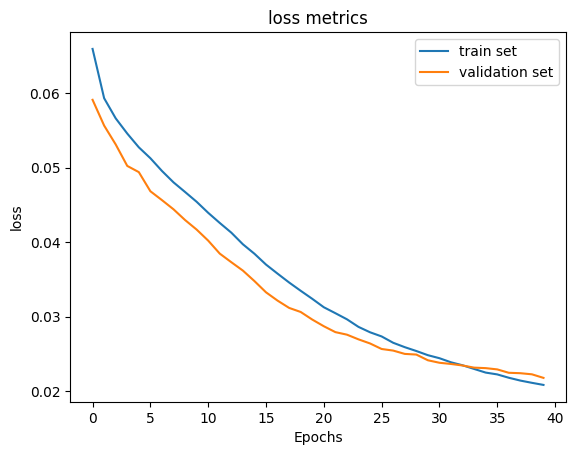

In [48]:
output_emb_metrics(history, "loss")

In [49]:
torch.save(extractor.state_dict(), "embedding_extractor.pt")

In [10]:
link = "/kaggle/input/custom-inception-emb-extractor/embedding_extractor_2.pt"
extractor.load_state_dict(torch.load(link, map_location=device))

<ipython-input-10-b34b134215ff>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  extractor.load_state_dict(torch.load(link, map_location=device))


<All keys matched successfully>

In [15]:
# will return: L, AB and grayscaled_rgb (for embedding extraction)

class UpdCustomDataset(Dataset):
    def __init__(self, data, transformer=None, emb_transformer=None):
        self.data = data
        self.data_list = sorted(os.listdir(self.data))
        self.transformer=transformer
        self.emb_transformer = emb_transformer

        
    def __len__(self):
        return len(self.data_list)
    def __getitem__(self, idx):
        img = os.path.join(self.data, self.data_list[idx])
        img = Image.open(img).convert("RGB")

        gray_img = img.convert("L")
        gray_img = gray_img.convert("RGB")
        
        
        if self.transformer:
            img = self.transformer(img)
        if self.emb_transformer:
            gray_img = self.emb_transformer(gray_img)

        image = img.permute(1, 2, 0).numpy()
        lab_image = rgb2lab(image)

        L = lab_image[:, :, 0] / 100.0
        AB = lab_image[:, :, 1:] / 128.0

        # lab_image = torch.tensor(lab_image, dtype=torch.float32).permute(2, 0, 1)
        # img = torch.tensor(gray_img, dtype=torch.float32).permute(2, 0, 1)
        
        L = torch.tensor(L, dtype=torch.float32).unsqueeze(0)
        AB = torch.tensor(AB, dtype=torch.float32).permute(2, 0, 1)

        return L, AB, gray_img

In [11]:
# embedding extraction process from UpdCustomDataset
def extract_embeddings(emb_dl, extractor, name, output_shape=False):
    all_embeddings = []
    extractor.eval()
    with torch.no_grad():
        for batch in tqdm(emb_dl):
            _, _, x = batch
            x = x.to(device)
            emb = extractor(x, return_emb=True)
            all_embeddings.append(emb.cpu())
    
    all_embeddings = torch.cat(all_embeddings, dim=0)
    if output_shape == True:
        print(all_embeddings.shape)
    torch.save(all_embeddings, f"{name}.pt")

In [21]:
emb_transformer = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor()
    
])

transformer = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
    
])

emb_data = "/kaggle/input/historical-photos-7/data_05"
emb_dataset = UpdCustomDataset(emb_data, transformer=transformer, emb_transformer=emb_transformer)
emb_dl = DataLoader(emb_dataset, batch_size=32, generator=torch.Generator(device="cpu"))

In [22]:
_, _, x = next(iter(emb_dl))
print(x.shape)

torch.Size([32, 3, 299, 299])


In [23]:
extract_embeddings(emb_dl, extractor, "train_val_emb", output_shape=True)

100%|██████████| 391/391 [07:00<00:00,  1.07s/it]

torch.Size([12500, 2048])


In [24]:
# final dataset, which will return: L, AB and extracted embedding [-1, 512]
class NewCustomDataset(Dataset):
    def __init__(self, data, embedding_file, transformer=None, return_lab = False, return_rgb = False):
        self.data = data
        self.data_list = sorted(os.listdir(self.data))
        self.transformer=transformer
        self.embeddings = torch.load(embedding_file)
        
        self.return_lab = return_lab
        self.return_rgb = return_rgb
        
    def __len__(self):
        return len(self.data_list)
    def __getitem__(self, idx):
        img = os.path.join(self.data, self.data_list[idx])
        img = Image.open(img).convert("RGB")

        gray_img = img.convert("L")
        gray_img = gray_img.convert("RGB")
        
        
        if self.transformer:
            img = self.transformer(img)
        
        image = img.permute(1, 2, 0).numpy()
        lab_image = rgb2lab(image)

        L = lab_image[:, :, 0] / 100.0
        AB = lab_image[:, :, 1:] / 128.0

        lab_image = torch.tensor(lab_image, dtype=torch.float32).permute(2, 0, 1)
        # img = torch.tensor(gray_img, dtype=torch.float32).permute(2, 0, 1)
        
        L = torch.tensor(L, dtype=torch.float32).unsqueeze(0)
        AB = torch.tensor(AB, dtype=torch.float32).permute(2, 0, 1)

        emb = self.embeddings[idx]

        if self.return_lab == True: 
            return L, AB, lab_image 
        elif self.return_rgb == True:
            return L, AB, emb
        else:
            return L, AB

In [25]:
transformer = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
    
])

embeddings = "/kaggle/working/train_val_emb.pt"
data = "/kaggle/input/historical-photos-7/data_05"
dataset = NewCustomDataset(data, embeddings, transformer=transformer, return_rgb=True)

<ipython-input-24-9ae666e89434>:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.embeddings = torch.load(embedding_file)


In [27]:
test_link = "/kaggle/input/testing-history-images/test_data "
test_data = UpdCustomDataset(test_link, transformer, emb_transformer)
t_test_dl = DataLoader(test_data, batch_size=32, generator=torch.Generator(device="cpu"))

In [28]:
extract_embeddings(t_test_dl, extractor, "test_emb", output_shape=True)

100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

torch.Size([22, 2048])


In [29]:
test_link = "/kaggle/input/testing-history-images/test_data "
test_embeddings = "//kaggle/working/test_emb.pt"
test_data = NewCustomDataset(test_link, test_embeddings, transformer=transformer, return_rgb=True)

<ipython-input-24-9ae666e89434>:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.embeddings = torch.load(embedding_file)


In [30]:
train_data, val_data = random_split(dataset, [0.9, 0.1])

In [8]:
# val_data, _ = random_split(val_data, [0.6, 0.4])

In [9]:
# train_data, _ = random_split(dataset, [0.6, 0.4])

In [31]:
len(train_data), len(val_data)

(11250, 1250)

In [32]:
x, y, z = train_data[0]
print(x.shape, y.shape, z.shape)

torch.Size([1, 256, 256]) torch.Size([2, 256, 256]) torch.Size([2048])


In [33]:
x, y, z = test_data[0]
print(x.shape, y.shape, z.shape)

torch.Size([1, 256, 256]) torch.Size([2, 256, 256]) torch.Size([2048])


In [34]:
def new_output(data, limit):
    for i, (x, y, z) in enumerate(data):
    
        L_image = x.permute(1, 2, 0).cpu().numpy()
        l_channel = x.permute(1, 2, 0).squeeze(2).cpu().numpy()

        ab_channels = y.permute(1, 2, 0).cpu().numpy()

        a_channel = ab_channels[:, :, 0]
        b_channel = ab_channels[:, :, 1]

        L = np.clip(l_channel*100, 0, 100).astype(np.uint8)
        A = np.clip(a_channel*128, -128, 127).astype(np.int8)
        B = np.clip(b_channel*128, -128, 127).astype(np.int8)

        lab_image = np.stack([L, A, B], axis=-1).astype(np.float64)
        rgb_image = lab2rgb(lab_image)
        rgb_image = np.clip(rgb_image * 255, 0, 255).astype(np.uint8)
        
        # gray_rgb_image = z.permute(1, 2, 0).cpu().numpy()
        # rgb_image = lab2rgb(lab_image)
    
        plt.figure(figsize=(10, 6))
        
        plt.subplot(1, 3, 1)
        plt.title("Grayscaled")
        plt.imshow(L_image)
    
        plt.subplot(1, 3, 2)
        plt.title("LAB image")
        plt.imshow(lab_image)
    
        plt.subplot(1, 3, 3)
        plt.title("RGB image")
        plt.imshow(rgb_image)
    
        plt.show()
    
        if i+1 >= limit:
            break

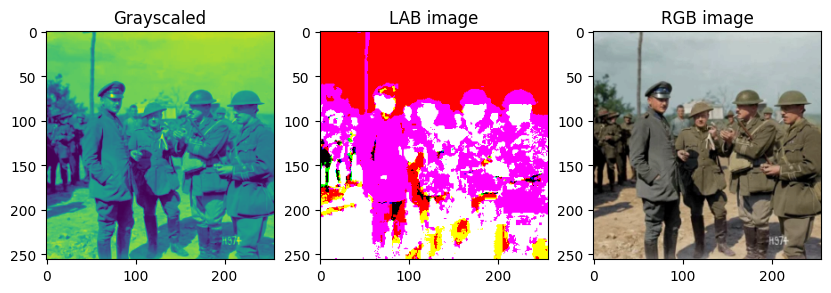

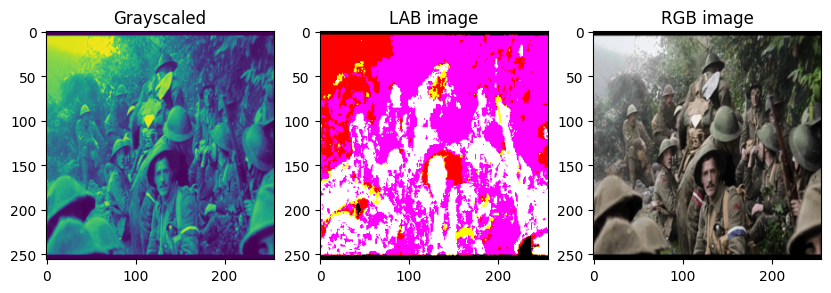

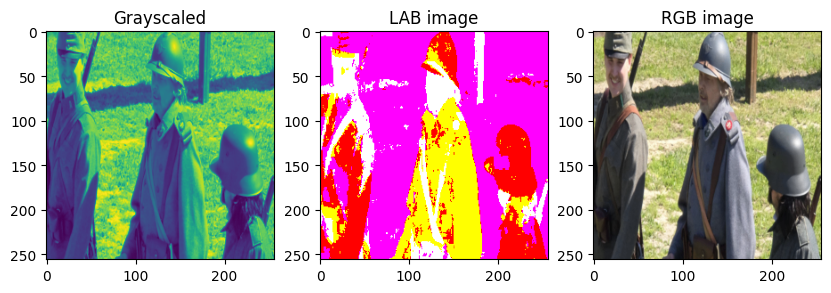

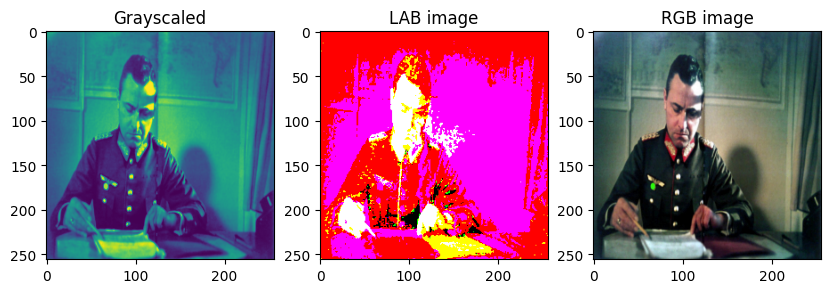

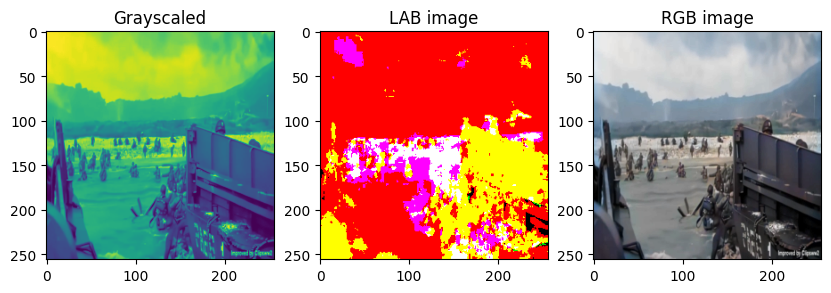

In [35]:
new_output(train_data, 5)

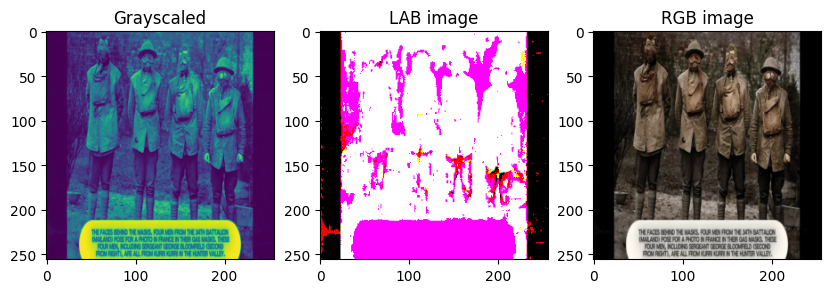

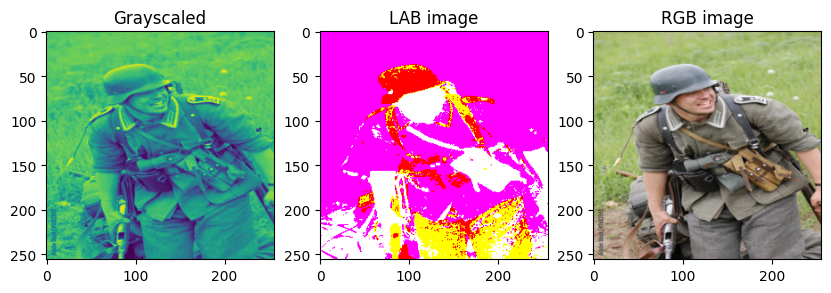

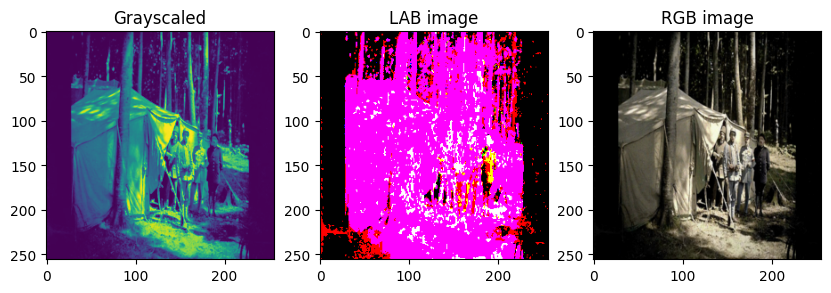

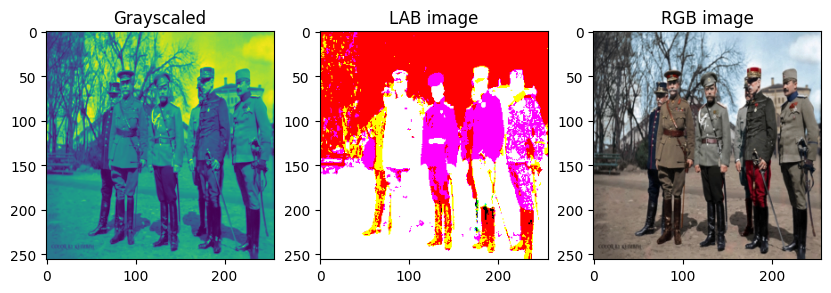

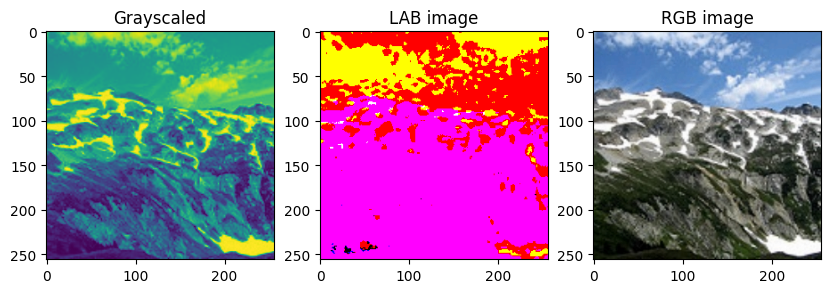

In [41]:
new_output(val_data, 5)

In [36]:
batch_size = 64
train_dl = DataLoader(train_data, batch_size=batch_size, shuffle=True, generator=torch.Generator(device="cpu"))
val_dl = DataLoader(val_data, batch_size=batch_size, shuffle=True, generator=torch.Generator(device="cpu"))

In [37]:
x, y, z = next(iter(train_dl))
x.shape, y.shape, z.shape

(torch.Size([64, 1, 256, 256]),
 torch.Size([64, 2, 256, 256]),
 torch.Size([64, 2048]))

In [38]:
def upd_train(model, train_dl, val_dl, loss_fn, psnr, ssim, optimizer, epochs, device):

    
    data = pd.DataFrame(columns=["Epochs", "Train Loss", "Train PSNR", "Train SSIM", "Val Loss", "Val PSNR", "Val SSIM"])
    
    history = {
        "train_loss": [],
        "val_loss": [],
        
        "train_psnr": [],
        "val_psnr": [],
        
        "train_ssim": [],
        "val_ssim": []
    }

    for epoch in range(epochs):
        model.train()
        # pretrained_model.eval()
        
        train_loss = 0.0
        train_psnr = 0.0
        train_ssim = 0.0

        for x, y, z in tqdm(train_dl):
            x = x.to(device)
            y = y.to(device)
            embaddings = z.to(device)

            # with torch.no_grad():
            #     embaddings = pretrained_model(z)

            optimizer.zero_grad()
            preds = model(x, embaddings)

        
            loss = loss_fn(y, preds)
            train_loss += loss.item()
            loss.backward()
            optimizer.step()

            t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=2.0)
            train_psnr += t_psnr

            preds_np = preds.cpu().detach().numpy()
            y_np = y.cpu().detach().numpy()
            
            ssim_train = []
            for i in range(preds_np.shape[0]):
                pred = preds_np[i]
                target = y_np[i]
                ssim_tr = ssim(pred, target, win_size=7, data_range=2.0, channel_axis=0)
                ssim_train.append(ssim_tr)
            t_ssim = np.mean(ssim_train)
            train_ssim += t_ssim

            # if preds_np.shape[1] > 1:  
            #     preds_np = preds_np.mean(axis=1) 
            #     y_np = y_np.mean(axis=1)

            # print(preds_np.squeeze().shape, y_np.squeeze().shape)
            # t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=7, data_range=2.0, channel_axis=1)
            # train_ssim += t_ssim

        total_train_loss = train_loss / len(train_dl)
        total_train_psnr = train_psnr / len(train_dl)
        total_train_ssim = train_ssim / len(train_dl)

        model.eval()
        # pretrained_model.eval()
        
        val_loss = 0.0
        val_psnr = 0.0
        val_ssim = 0.0

        with torch.no_grad():
            for x, y, z in tqdm(val_dl):
                x = x.to(device)
                y = y.to(device)
                embaddings = z.to(device)

                # embaddings = pretrained_model(z)
                preds = model(x, embaddings)
    
                loss = loss_fn(preds, y)
                val_loss += loss.item()
    
                t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=2.0)
                val_psnr += t_psnr
    
                preds_np = preds.cpu().detach().numpy()
                y_np = y.cpu().detach().numpy()

                ssim_vals = []
                for i in range(preds_np.shape[0]):
                    pred = preds_np[i]
                    target = y_np[i]

                    ssim_val = ssim(pred, target, win_size=5, data_range=2.0, channel_axis=0)
                    ssim_vals.append(ssim_val)
                t_ssim = np.mean(ssim_vals)
                val_ssim += t_ssim
    
                # if preds_np.shape[1] > 1:  
                #     preds_np = preds_np.mean(axis=1) 
                #     y_np = y_np.mean(axis=1)
                # print(preds_np.squeeze().shape, y_np.squeeze().shape)
                # t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=5, data_range=2.0, channel_axis=1)
                # val_ssim += t_ssim

        total_val_loss = val_loss / len(val_dl)
        total_val_psnr = val_psnr / len(val_dl)
        total_val_ssim = val_ssim / len(val_dl)

        history["train_loss"].append(total_train_loss)
        history["train_psnr"].append(total_train_psnr)
        history["train_ssim"].append(total_train_ssim)

        history["val_loss"].append(total_val_loss)
        history["val_psnr"].append(total_val_psnr)
        history["val_ssim"].append(total_val_ssim)

        data.loc[epoch] = [int(epoch+1), round(total_train_loss, 4), round(total_train_psnr, 4), round(total_train_ssim, 4), round(total_val_loss, 4), round(total_val_psnr, 4), round(total_val_ssim, 4)]
        data["Epochs"] = data["Epochs"].astype(int)

        print(
            f"Epoch: {epoch+1}; "
            f"train_loss: {total_train_loss:.4f}; train_psnr: {total_train_psnr:.4f}; train_ssim: {total_train_ssim:.4f}; "
            f"val_loss: {total_val_loss:.4f}; val_psnr: {total_val_psnr:.4f}; val_ssim: {total_val_ssim:.4f}"
        )

        idx = epoch + 1
        pre_idx = idx - 10
        
        pre_file = f"/kaggle/working/weights_{pre_idx}.pt"
        pre_data_file = f"/kaggle/working/history_{pre_idx}.csv"
        

        if os.path.isfile(pre_file):
            os.remove(pre_file)

        if os.path.isfile(pre_data_file):
            os.remove(pre_data_file)

        if idx % 10 == 0:
            torch.save(model.state_dict(), f"/kaggle/working/weights_{idx}.pt")
            data.to_csv(f"history_{idx}.csv")
        

    return history


In [ ]:
# SAVE WEIGHT OF PRETRAINED MODEL ALSO!!!!

In [ ]:
# # 1st version 
# class SEBLock(nn.Module):
#     def __init__(self, C, r=16):
#         super().__init__()

#         self.aap = nn.AdaptiveAvgPool2d((1, 1))
#         self.flatten = nn.Flatten()

#         self.linear1 = nn.Linear(C, C//r)
#         self.linear2 = nn.Linear(C//r, C)

#         self.relu = nn.ReLU()
#         self.sigmoid = nn.Sigmoid()

#     def forward(self, x):
#         out = self.aap(x)
#         out = self.flatten(out)

#         out = self.linear1(out)
#         out = self.relu(out)

#         out = self.linear2(out)
#         out = self.sigmoid(out)

#         out = out[:, :, None, None]

#         res = out * x

#         return res 






# class NewColorized(nn.Module):
#     def __init__(self, inputs=1, outputs=2, embedding_shape = 512):
#         super().__init__()

#         # self.embadding_layer = nn.Linear(embedding_shape, 128) 

#         self.conv1 = nn.Conv2d(inputs, 32, kernel_size=4, stride=2, padding=1)
#         self.bnorm1 = nn.BatchNorm2d(32)
#         self.seblock1 = SEBLock(32)
        
#         self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
#         self.bnorm2 = nn.BatchNorm2d(64)
#         self.seblock2 = SEBLock(64)

#         self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
#         self.bnorm3 = nn.BatchNorm2d(128)
#         self.seblock3 = SEBLock(128)

#         self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)
#         self.bnorm4 = nn.BatchNorm2d(256)
#         self.seblock4 = SEBLock(256)

#         self.btn_conv5 = nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=3, dilation=2)
#         self.bnorm5 = nn.BatchNorm2d(512)
#         self.seblock5 = SEBLock(512)

#         self.no_emb_conv = nn.Conv2d(512, 1024, kernel_size=4, stride=1, padding=3, dilation=2)
#         self.no_emb_bnorm = nn.BatchNorm2d(1024)
#         self.no_emb_seblock = SEBLock(1024)

#         self.emd_conv = nn.Conv2d(1024, 512, kernel_size=4, stride=1, padding=3, dilation=2)
#         self.emb_bnorm = nn.BatchNorm2d(512)
#         self.emb_seblock = SEBLock(512)
  
#         self.btn_conv6 = nn.Conv2d(512, 256, kernel_size=4, stride=1, padding=3, dilation=2)
#         self.bnorm6 = nn.BatchNorm2d(256)
#         self.seblock6 = SEBLock(256)

    
#         self.t_conv1 = nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1)
#         self.t_bnorm1 = nn.BatchNorm2d(128)
#         self.seblock7 = SEBLock(128)

#         self.t_conv2 = nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1)
#         self.t_bnorm2 = nn.BatchNorm2d(64)
#         self.seblock8 = SEBLock(64)

#         self.t_conv3 = nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1)
#         self.t_bnorm3 = nn.BatchNorm2d(32)
#         self.seblock9 = SEBLock(32)

#         self.t_conv4 = nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1)
        
#         # self.t_conv5 = nn.Conv2d(161, 64, kernel_size=3, padding=1)
#         # self.t_bnorm5 = nn.BatchNorm2d(64)
        
#         self.t_conv5 = nn.Conv2d(3, outputs, kernel_size=3, padding=1)

#     def forward(self, x, embadding=None, return_latent=False):
       
#         x1 = F.leaky_relu(self.bnorm1(self.conv1(x)))
#         # x1 = self.seblock1(x1)
#         # print(x1.shape)

#         x2 = F.leaky_relu(self.bnorm2(self.conv2(x1)))
#         # x2 = self.seblock2(x2)
#         # print(x2.shape)

#         x3 = F.leaky_relu(self.bnorm3(self.conv3(x2)))
#         # x3 = self.seblock3(x3)
#         # print(x3.shape)

#         x4 = F.leaky_relu(self.bnorm4(self.conv4(x3)))
#         # x4 = self.seblock4(x4)
#         # print(x4.shape)

#         x5 = F.leaky_relu(self.bnorm5(self.btn_conv5(x4)))
#         x5 = self.seblock5(x5)
#         # print(x5.shape)

#         # if return_latent == True:
#         #     return x5

#         if embadding is None:
#             filler = torch.zeros(x5.size(0), 512, x5.size(2), x5.size(3), device=x5.device)

#             x5_emb = torch.cat((x5, filler), 1)
#             x5_emb = F.leaky_relu(self.emb_bnorm(self.emd_conv(x5_emb)))
#             x5 = self.emb_seblock(x5_emb)
              
#         else:
#             # add H and W to the output of linear block [1, 128] -> [1, 128, 1, 1]
#             # if embadding.size(1) == 512:
#             embadding = embadding.unsqueeze(-1).unsqueeze(-1) 
#             # put embadding in the same size as input tesnor:  [1, 128, 1, 1] -> [1, 128, 256, 256]
#             embadding = embadding.expand(-1, -1, x5.size(2), x5.size(3))
#             # print(embadding.shape, x5.shape)
#             x5_emb = torch.cat((x5, embadding), 1)
#             x5_emb = F.leaky_relu(self.emb_bnorm(self.emd_conv(x5_emb)))
#             x5 = self.emb_seblock(x5_emb)

#         if return_latent == True:
#             return x5

#         # print(x5_emb.shape)

#         x6 = F.leaky_relu(self.bnorm6(self.btn_conv6(x5)))
#         # x6 = self.seblock6(x6)
#         # print(x6.shape)

#         x7 = torch.cat((x6, x4), 1)
#         # print(x7.shape)

#         x8 = F.leaky_relu(self.t_bnorm1(self.t_conv1(x7)))
#         # x8 = self.seblock7(x8)
#         # print(x8.shape)

#         x9 = torch.cat((x8, x3), 1)
#         # print(x9.shape)

#         x10 = F.leaky_relu(self.t_bnorm2(self.t_conv2(x9)))
#         # x10 = self.seblock8(x10)
#         # print(x10.shape)

#         x11 = torch.cat((x10, x2), 1)
#         # print(x11.shape)

#         x12 = F.leaky_relu(self.t_bnorm3(self.t_conv3(x11)))
#         # x12 = self.seblock9(x12)
#         # print(x12.shape)

#         x13 = torch.cat((x12, x1), 1)
#         # print(x13.shape)

#         x14 = F.leaky_relu(self.t_conv4(x13))
#         # print(x14.shape)

#         x15 = torch.cat((x14, x), 1)
#         # print(x15.shape)

#         x16 = F.tanh(self.t_conv5(x15))
        
#         return x16
    
    
#     def predict(self, l_channel, embaddings):
#         self.eval()
        
#         with torch.no_grad():
#             ab_channels = self.forward(l_channel, embaddings)
            
#         # print("Shape of output from model:", ab_channels.shape)
#         # print("Min/Max values in ab_channels (before scaling):", ab_channels.min().item(), ab_channels.max().item())
        
#         l_channel = l_channel.squeeze(0).cpu().numpy()
#         a_channel = ab_channels[:, 0, :, :].cpu().numpy()
#         b_channel = ab_channels[:, 1, :, :].cpu().numpy()
        
#         # print("Min/Max a_channel (after extraction):", a_channel.min(), a_channel.max())
#         # print("Min/Max b_channel (after extraction):", b_channel.min(), b_channel.max())
        
#         # Масштабируем значения
#         l_channel = np.clip(l_channel * 100, 0, 100).astype(np.uint8)
#         a_channel = np.clip(a_channel * 128, -128, 127).astype(np.int8)
#         b_channel = np.clip(b_channel * 128, -128, 127).astype(np.int8)

        
#         lab_img = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float64)
#         rgb_image = lab2rgb(lab_img)
        
#         # if first_way == True
#         rgb_image = (rgb_image * 255).astype(np.uint8)
#         # rgb_image = (rgb_image * 255)
#         rgb_image = rgb_image.squeeze()
#         # # rgb_image = np.clip(rgb_image, 0, 255)
#         # elif second_way == True:
#         #     rgb_image = rgb_image * 255    
#         #     rgb_image = np.clip(rgb_image, 0, 255)

#         # print("Min/Max RGB image:", rgb_image.min(), rgb_image.max())
        
#         return rgb_image

        
    
# model = NewColorized()
# model.to(device)

In [ ]:
# class SEBlock(nn.Module):
#     def __init__(self, C, r=16):
#         super().__init__()
        
#         self.aap = nn.AdaptiveAvgPool2d((1, 1))
#         self.flatten = nn.Flatten()
        
#         self.linear1 = nn.Linear(C, C//r)
#         self.linear2 = nn.Linear(C//r, C)
        
#         self.relu = nn.ReLU()
#         self.sigmoid = nn.Sigmoid()
        
#     def forward(self, x):
#         out = self.aap(x)
#         out = self.flatten(out)
        
#         out = self.relu(self.linear1(out))
#         out = self.sigmoid(self.linear2(out))
        
#         out = out[:, :, None, None]
        
#         res = out * x
#         return res



# class SE_ResBlock(nn.Module):
#     def __init__(self, inputs, outputs, kernel, stride):
#         super().__init__()
        
#         self.conv1 = nn.Sequential(
#             nn.Conv2d(inputs, outputs, kernel_size=kernel, stride=stride, padding=1),
#             nn.BatchNorm2d(outputs),
#         )
        
#         self.conv2 = nn.Sequential(
#             nn.Conv2d(outputs, outputs, kernel_size=3, stride=1, padding=1),
#             nn.BatchNorm2d(outputs),
#         )
        
#         if inputs != outputs:
#             self.add_conv = nn.Sequential(
#                 nn.Conv2d(inputs, outputs, kernel_size=kernel, stride=stride, padding=1),
#                 nn.BatchNorm2d(outputs),
#             )
            
#         self.se_block = SEBlock(outputs)
    
        
        
#     def forward(self, x):
#         out = self.conv1(x)
#         add_out = self.add_conv(x)
        
#         out = F.leaky_relu(out)
#         out = self.conv2(out)
#         out = self.se_block(out)
        
#         out += add_out
        
#         out = F.leaky_relu(out)
        
#         return out



# class Autoencoder(nn.Module):
#     def __init__(self, inputs=1, outputs=2):
#         super().__init__()
        
#         self.conv1 = SE_ResBlock(inputs, 32, kernel=4, stride=2)
#         self.conv2 = SE_ResBlock(32, 64, kernel=4, stride=2)
#         self.conv3 = SE_ResBlock(64, 128, kernel=4, stride=2)
#         self.conv4 = SE_ResBlock(128, 256, kernel=4, stride=2)
        
#         self.conv5 = nn.Sequential(
#             nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=2, dilation=2),
#             nn.BatchNorm2d(512),
#             nn.LeakyReLU()
#         )
        
#         # self.emb = nn.Sequential(
#         #     SE_ResBlock(1024, 512, kernel=3, stride=1),
#         # )
        
#         self.conv6 = nn.Sequential(
#             nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=2, dilation=2),
#             nn.BatchNorm2d(256),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv1 = nn.Sequential(
#             nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(128),
#             nn.LeakyReLU()
#         )
#         self.t_conv2 = nn.Sequential(
#             nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(64),
#             nn.LeakyReLU()
#         )
        
        
#         self.t_conv3 = nn.Sequential(
#             nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(32),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv4 = nn.Sequential(
#             nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1),
#             nn.LeakyReLU()
#         )
#         self.t_conv5 = nn.ConvTranspose2d(3, outputs, kernel_size=3, stride=1, padding=1)
        
    
#         self.linear_block = nn.Sequential(
#             nn.LeakyReLU(),
#             nn.Linear(2048, 512)
#         )
        
        
    
#     def forward(self, x, embadding=None, return_latent=False):
#         x1 = self.conv1(x)
#         x2 = self.conv2(x1)
#         x3 = self.conv3(x2)
#         x4 = self.conv4(x3)
        
#         x5 = self.conv5(x4)
        
#         if embadding is not None:
#             embadding_tensor = self.linear_block(embadding)
                
#             embadding_tensor = embadding_tensor.unsqueeze(-1).unsqueeze(-1)
#             embadding_tensor = embadding_tensor.expand(-1, -1, x5.size(2), x5.size(3))
#         else: 
#             print("No embedding provided.")
#             embadding_tensor = torch.zeros(x5.size(0), 512, x5.size(2), x5.size(3)).to(device)
        
#         # x5 = torch.concat((embadding_tensor, x5), dim=1)
#         # x5 = self.emb(x5)
        
#         x5 += embadding_tensor
        
#         if return_latent == True:
#             return x5
        
#         x6 = self.conv6(x5)
        
#         x7 = torch.cat((x6, x4), 1)
#         x7 = self.t_conv1(x7)
        
#         x8 = torch.cat((x7, x3), 1)
#         x8 = self.t_conv2(x8)
        
#         x9 = torch.cat((x8, x2), 1)
#         x9 = self.t_conv3(x9)
        
#         x10 = torch.cat((x9, x1), 1)
#         x10 = self.t_conv4(x10)
        
#         x11 = torch.cat((x10, x), 1)
#         x11 = F.tanh(self.t_conv5(x11))
                
#         return x11
    
    
#     def predict(self, l_channel, rgb_image=None):
#         self.eval()
        
#         with torch.no_grad():
#             if rgb_image is not None:
#                 ab_channels = self.forward(l_channel, embadding=rgb_image)
#             else:
#                 ab_channels = self.forward(l_channel)
                
#         l_channel = l_channel.squeeze(0).permute(1, 2, 0).squeeze(2).cpu().numpy()
#         # l_channel =  l_channel.permute(1, 2, 0).cpu().numpy()
#         ab_channels = ab_channels.squeeze(0).permute(1, 2, 0).cpu().numpy()
        
#         a_channel = ab_channels[:, :, 0]
#         b_channel = ab_channels[:, :, 1]
        
#         l_channel = np.clip(l_channel*100, 0, 100).astype(np.uint8)
#         a_channel = np.clip(a_channel*128, -128, 127).astype(np.int8)
#         b_channel = np.clip(b_channel*128, -128, 127).astype(np.int8)
        
#         lab_image = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float64)
#         rgb_image = lab2rgb(lab_image)
        
#         rgb_image = np.clip(rgb_image*255, 0, 255).astype(np.uint8)
        
#         # rgb_image =  np.clip(rgb_image, 0, 1).astype(np.uint8)
        
#         return rgb_image
        


# teacher_model = Autoencoder()
# teacher_model.to(device)

In [14]:
# from torchvision import models

# class Autoencoder(nn.Module):
#     def __init__(self, inputs=1, outputs=2):
#         super().__init__()
        
#         self.encoder1 = nn.Conv2d(inputs, 128, kernel_size=3, padding=1)
#         self.bnorm1 = nn.BatchNorm2d(128)
#         self.pool1 = nn.MaxPool2d(2, stride=2, padding=1)
        
#         self.encoder2 = nn.Conv2d(128, 128, kernel_size=4, padding=1)
#         self.bnorm2 = nn.BatchNorm2d(128)
        
#         self.encoder3 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
#         self.bnorm3 = nn.BatchNorm2d(128)
#         self.pool3 = nn.MaxPool2d(2, stride=2, padding=1)
        
#         self.encoder4 = nn.Conv2d(128, 256, kernel_size=4, padding=1)
#         self.bnorm4 = nn.BatchNorm2d(256)
        
#         self.encoder5 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
#         self.bnorm5 = nn.BatchNorm2d(256)
#         self.pool5 = nn.MaxPool2d(2, stride=2, padding=1)
        
#         self.encoder6 = nn.Conv2d(256, 256, kernel_size=4, padding=1)
#         self.bnorm6 = nn.BatchNorm2d(256)
        
#         self.encoder7 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
#         self.bnorm7 = nn.BatchNorm2d(256)
        
#         self.encoder8 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
#         self.bnorm8 = nn.BatchNorm2d(256)
       
#         self.fusion_1 = nn.Conv2d(256 + 1000, 256, kernel_size=1, padding=1)
#         self.bnorm9 = nn.BatchNorm2d(256)
        
#         self.decoder1 = nn.Conv2d(256, 128, kernel_size=4, padding=1)
#         self.bnorm10 = nn.BatchNorm2d(128)
        
#         self.decoder2 = nn.Conv2d(128, 64, kernel_size=4, padding=1)
#         self.bnorm11 = nn.BatchNorm2d(64)
#         self.up2 = nn.Upsample(scale_factor=2, mode="nearest")
        
#         self.decoder3 = nn.Conv2d(64, 128, kernel_size=4, padding=1)
#         self.bnorm12 = nn.BatchNorm2d(128)
#         self.up3 = nn.Upsample(scale_factor=2, mode="nearest")
        
#         self.decoder4 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
#         self.bnorm13 = nn.BatchNorm2d(64)
        
#         self.decoder5 = nn.Conv2d(64, 64, kernel_size=3, padding=2)
#         self.bnorm14 = nn.BatchNorm2d(64)
        
#         self.decoder6 = nn.Conv2d(64, 32, kernel_size=4, padding=1)
#         self.bnorm15 = nn.BatchNorm2d(32)
        
#         self.decoder7 = nn.Conv2d(32, outputs, kernel_size=4, padding=2)
#         self.up7 = nn.Upsample(scale_factor=2, mode="nearest")
        
#         self.encoder2_1 = nn.Conv2d(inputs, 128, kernel_size=3, padding=1)
#         self.pool2_1 = nn.MaxPool2d(2, stride=2, padding=1)
#         self.bnorm16 = nn.BatchNorm2d(128)
        
#         self.encoder2_2 = nn.Conv2d(128, 128, kernel_size=4, padding=1)
#         self.bnorm17 = nn.BatchNorm2d(128)
        
#         self.encoder2_3 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
#         self.bnorm18 = nn.BatchNorm2d(128)
#         self.pool2_3 = nn.MaxPool2d(2, stride=2, padding=1)
        
#         self.encoder2_4 = nn.Conv2d(128, 256, kernel_size=4, padding=1)
#         self.bnorm19 = nn.BatchNorm2d(256)
        
#         self.encoder2_5 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
#         self.bnorm20 = nn.BatchNorm2d(256)
#         self.pool2_5 = nn.MaxPool2d(2, stride=2, padding=1)
        
#         self.encoder2_6 = nn.Conv2d(256, 256, kernel_size=4, padding=1)
#         self.bnorm21 = nn.BatchNorm2d(256)
        
#         self.encoder2_7 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
#         self.bnorm22 = nn.BatchNorm2d(256)
        
#         self.encoder2_8 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
#         self.bnorm23 = nn.BatchNorm2d(256)
        
#         self.fusion_2 = nn.Conv2d(256, 512, kernel_size=1, padding=1)
#         self.bnorm24 = nn.BatchNorm2d(512)
        
#         self.decoder2_1 = nn.Conv2d(512, 128, kernel_size=4, padding=1)
#         self.decoder2_2 = nn.Conv2d(128, 64, kernel_size=4, padding=1)
#         self.up2_2 = nn.Upsample(scale_factor=2, mode="nearest")
#         self.decoder2_3 = nn.Conv2d(64, 128, kernel_size=4, padding=1)
#         self.up2_3 = nn.Upsample(scale_factor=2, mode="nearest")
#         self.decoder2_4 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
#         self.decoder2_5 = nn.Conv2d(64, 64, kernel_size=3, padding=2)
#         self.decoder2_6 = nn.Conv2d(64, 32, kernel_size=4, padding=1)
#         self.decoder2_7 = nn.Conv2d(32, outputs, kernel_size=4, padding=2)
#         self.up2_7 = nn.Upsample(scale_factor=2, mode="nearest")
        
#         self.encoder3_1 = nn.Conv2d(4, 128, kernel_size=3, padding=1)
#         self.pool3_1 = nn.MaxPool2d(2, stride=2, padding=1)
#         self.encoder3_2 = nn.Conv2d(128, 128, kernel_size=4, padding=1)
#         self.encoder3_3 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
#         self.pool3_3 = nn.MaxPool2d(2, stride=2, padding=1)
#         self.encoder3_4 = nn.Conv2d(128, 256, kernel_size=4, padding=1)
#         self.encoder3_5 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
#         self.pool3_5 = nn.MaxPool2d(2, stride=2, padding=1)
#         self.encoder3_6 = nn.Conv2d(256, 256, kernel_size=4, padding=1)
#         self.encoder3_7 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
#         self.encoder3_8 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        
#         self.fusion_3 = nn.Conv2d(256, 512, kernel_size=1, stride=1, padding=1)
        
#         self.decoder3_1 = nn.Conv2d(512, 128, kernel_size=4, stride=1, padding=1)
#         self.decoder3_2 = nn.Conv2d(128, 64, kernel_size=4, stride=1, padding=1)
#         self.up3_2 = nn.Upsample(scale_factor=2, mode="nearest")
#         self.decoder3_3 = nn.Conv2d(64, 128, kernel_size=4, stride=1, padding=1)
#         self.up3_3 = nn.Upsample(scale_factor=2, mode="nearest")
#         self.decoder3_4 = nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1)
#         self.decoder3_5 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=2)
#         self.decoder3_6 = nn.Conv2d(64, 32, kernel_size=4, stride=1, padding=1)
#         self.decoder3_7 = nn.Conv2d(32, outputs, kernel_size=3, stride=1, padding=2)
#         self.up3_7 = nn.Upsample(scale_factor=2, mode="nearest")

        
#         self.linear = nn.Sequential(
#             nn.Linear(2048, 1000),
#             nn.ReLU()
#         )
        
        

#     def forward(self, inputs, embadding=None, return_latent=False):
#         x = F.relu(self.pool1(self.bnorm1(self.encoder1(inputs))))
#         x = F.relu(self.bnorm2(self.encoder2(x)))
#         x = F.relu(self.pool3(self.bnorm3(self.encoder3(x))))
#         x = F.relu(self.bnorm4(self.encoder4(x)))
#         x = F.relu(self.pool5(self.bnorm5(self.encoder5(x))))
#         x = F.relu(self.bnorm6(self.encoder6(x)))
#         x = F.relu(self.bnorm7(self.encoder7(x)))
#         x = F.relu(self.bnorm8(self.encoder8(x)))


#         if embadding is not None:
#             embadding = self.linear(embadding)
#             embadding = embadding.unsqueeze(2).unsqueeze(3).repeat(1, 1, 32, 32).to(device)
            
#             x = torch.cat((x, embadding), dim=1)
#         else:
#             embadding = torch.zeros(x.size(0), 1000)
#             embadding = embadding.unsqueeze(2).unsqueeze(3).repeat(1, 1, 32, 32).to(device)
#             # print(embadding.shape, x.shape)
#             x = torch.cat((x, embadding), dim=1)
#             # print(x.shape)

#         x = F.relu(self.bnorm9(self.fusion_1(x)))
        
#         x = F.relu(self.bnorm10(self.decoder1(x)))
#         x = F.relu(self.bnorm11(self.decoder2(x)))
#         x = self.up2(x)
#         x = F.relu(self.bnorm12(self.decoder3(x)))
#         x = self.up3(x)
#         x = F.relu(self.bnorm13(self.decoder4(x)))
#         x = F.relu(self.bnorm14(self.decoder5(x)))
#         x = F.relu(self.bnorm15(self.decoder6(x)))
#         x = F.tanh(self.decoder7(x))
#         output1 = self.up7(x)
        
        
#         x1 = F.relu(self.pool2_1(self.bnorm16(self.encoder2_1(inputs))))
#         x1 = F.relu(self.bnorm17(self.encoder2_2(x1)))
#         x1 = F.relu(self.pool2_3(self.bnorm16(self.encoder2_3(x1))))
#         x1 = F.relu(self.bnorm19(self.encoder2_4(x1)))
#         x1 = F.relu(self.pool2_5(self.bnorm20(self.encoder2_5(x1))))
#         x1 = F.relu(self.bnorm21(self.encoder2_6(x1)))
#         x1 = F.relu(self.bnorm22(self.encoder2_7(x1)))
#         x1 = F.relu(self.bnorm23(self.encoder2_8(x1)))
        
#         x2 = F.relu(self.bnorm24(self.fusion_2(x1)))
#         x2 = F.relu(self.decoder2_1(x2))
#         x2 = F.relu(self.decoder2_2(x2))
#         x2 = self.up2_2(x2)
#         x2 = F.relu(self.decoder2_3(x2))
#         x2 = self.up2_3(x2)
#         x2 = F.relu(self.decoder2_4(x2))
#         x2 = F.relu(self.decoder2_5(x2))
#         x2 = F.relu(self.decoder2_6(x2))
#         x2 = F.tanh(self.decoder2_7(x2))
#         output2 = self.up2_7(x2)
        
#         x3 = torch.cat((output1, output2), dim=1)
        
#         x3 = F.relu(self.pool1(self.encoder3_1(x3)))
#         x3 = F.relu(self.encoder3_2(x3))
#         x3 = F.relu(self.pool3_3(self.encoder3_3(x3)))
#         x3 = F.relu(self.encoder3_4(x3))
#         x3 = F.relu(self.pool3_5(self.encoder3_5(x3)))
#         x3 = F.relu(self.encoder3_6(x3))
#         x3 = F.relu(self.encoder3_7(x3))
#         x3 = F.relu(self.encoder3_8(x3))
        
#         x4 = F.relu(self.fusion_3(x3))
#         x4 = F.relu(self.decoder3_1(x4))
#         x4 = F.relu(self.decoder3_2(x4))
#         x4 = self.up3_2(x4)
#         x4 = F.relu(self.decoder3_3(x4))
#         x4 = self.up3_3(x4)
#         x4 = F.relu(self.decoder3_4(x4))
#         x4 = F.relu(self.decoder3_5(x4))
#         x4 = F.relu(self.decoder3_6(x4))
#         x4 = self.up3_7(x4)
#         output = F.tanh(self.decoder3_7(x4))
        
    
#         return output
        
        
        
        
        
        
#         # if embadding is not None:
#         #     self.pretrained_model.eval()
#         #     with torch.no_grad():
#         #         embadding_tensor = self.pretrained_model(embadding)
#         #     embadding_tensor = self.linear(embadding_tensor)
#         #     embadding_tensor = embadding_tensor.unsqueeze(-1).unsqueeze(-1)
#         #     embadding_tensor = embadding_tensor.expand(-1, -1, x5.size(2), x5.size(3))
#         # else: 
#         #     print("No embedding provided.")
#         #     embadding_tensor = torch.zeros(x5.size(0), 512, x5.size(2), x5.size(3))
#         # 
#         # # x5 = torch.concat((embadding_tensor, x5), dim=1)
#         # # x5 = self.emb(x5)
#         # 
#         # x5 += embadding_tensor
#         # 
#         # if return_latent == True:
#         #     return x5
#         # 
#         # x6 = self.conv6(x5)
#         # 
#         # x7 = torch.cat((x6, x4), 1)
#         # x7 = self.t_conv1(x7)
#         # 
#         # x8 = torch.cat((x7, x3), 1)
#         # x8 = self.t_conv2(x8)
#         # 
#         # x9 = torch.cat((x8, x2), 1)
#         # x9 = self.t_conv3(x9)
#         # 
#         # x10 = torch.cat((x9, x1), 1)
#         # x10 = self.t_conv4(x10)
#         # 
#         # x11 = torch.cat((x10, x), 1)
#         # x11 = F.tanh(self.t_conv5(x11))
#         #         
#         # return x11
    
    
#     def predict(self, l_channel, rgb_image=None):
#         self.eval()
        
#         with torch.no_grad():
#             if rgb_image is not None:
#                 ab_channels = self.forward(l_channel, embadding=rgb_image)
#             else:
#                 ab_channels = self.forward(l_channel)
                
#         l_channel = l_channel.squeeze(0).permute(1, 2, 0).squeeze(2).cpu().numpy()
#         # l_channel =  l_channel.permute(1, 2, 0).cpu().numpy()
#         ab_channels = ab_channels.squeeze(0).permute(1, 2, 0).cpu().numpy()
        
#         a_channel = ab_channels[:, :, 0]
#         b_channel = ab_channels[:, :, 1]
        
#         l_channel = np.clip(l_channel*100, 0, 100).astype(np.uint8)
#         a_channel = np.clip(a_channel*128, -128, 127).astype(np.int8)
#         b_channel = np.clip(b_channel*128, -128, 127).astype(np.int8)
        
#         lab_image = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float64)
#         rgb_image = lab2rgb(lab_image)
        
#         # rgb_image = np.clip(rgb_image*255, 0, 255).astype(np.uint8)
        
#         rgb_image =  np.clip(rgb_image, 0, 1).astype(np.uint8)
        
#         return rgb_image
        
        

In [28]:
# # device = "mps" if torch.backends.mps.is_available() else "cpu"

# import torch

# class SEBlock(nn.Module):
#     def __init__(self, C, r=16):
#         super().__init__()
        
#         self.aap = nn.AdaptiveAvgPool2d((1, 1))
#         self.flatten = nn.Flatten()
        
#         self.linear1 = nn.Linear(C, C//r)
#         self.linear2 = nn.Linear(C//r, C)
        
#         self.relu = nn.ReLU()
#         self.sigmoid = nn.Sigmoid()
        
#     def forward(self, x):
#         out = self.aap(x)
#         out = self.flatten(out)
        
#         out = self.relu(self.linear1(out))
#         out = self.sigmoid(self.linear2(out))
        
#         out = out[:, :, None, None]
        
#         res = out * x
#         return res



# class SE_ResBlock(nn.Module):
#     def __init__(self, inputs, outputs, kernel, stride):
#         super().__init__()
        
#         self.conv1 = nn.Sequential(
#             nn.Conv2d(inputs, outputs, kernel_size=kernel, stride=stride, padding=1),
#             nn.BatchNorm2d(outputs),
#         )
        
#         self.conv2 = nn.Sequential(
#             nn.Conv2d(outputs, outputs, kernel_size=3, stride=1, padding=1),
#             nn.BatchNorm2d(outputs),
#         )
        
#         if inputs != outputs:
#             self.add_conv = nn.Sequential(
#                 nn.Conv2d(inputs, outputs, kernel_size=kernel, stride=stride, padding=1),
#                 nn.BatchNorm2d(outputs),
#             )
            
#         self.se_block = SEBlock(outputs)
    
        
        
#     def forward(self, x):
#         out = self.conv1(x)
#         add_out = self.add_conv(x)
        
#         out = F.leaky_relu(out)
#         out = self.conv2(out)
#         out = self.se_block(out)
        
#         out += add_out
        
#         out = F.leaky_relu(out)
        
#         return out



# class Autoencoder(nn.Module):
#     def __init__(self, inputs=1, outputs=2, emb_size=512):
#         super().__init__()
        
#         self.conv1 = SE_ResBlock(inputs, 32, kernel=4, stride=2)
#         self.conv2 = SE_ResBlock(32, 64, kernel=4, stride=2)
#         self.conv3 = SE_ResBlock(64, 128, kernel=4, stride=2)
#         self.conv4 = SE_ResBlock(128, 256, kernel=4, stride=2)
        
#         self.conv5 = nn.Sequential(
#             nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=2, dilation=2),
#             nn.BatchNorm2d(512),
#             nn.LeakyReLU()
#         )
        
#         # self.emb = nn.Sequential(
#         #     SE_ResBlock(1024, 512, kernel=3, stride=1),
#         # )
        
#         self.conv6 = nn.Sequential(
#             nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=2, dilation=2),
#             nn.BatchNorm2d(256),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv1 = nn.Sequential(
#             nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(128),
#             nn.LeakyReLU()
#         )
#         self.t_conv2 = nn.Sequential(
#             nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(64),
#             nn.LeakyReLU()
#         )
        
        
#         self.t_conv3 = nn.Sequential(
#             nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(32),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv4 = nn.Sequential(
#             nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1),
#             nn.LeakyReLU()
#         )
#         self.t_conv5 = nn.ConvTranspose2d(3, outputs, kernel_size=3, stride=1, padding=1)
        
    
#         self.linear_block = nn.Sequential(
#             nn.LeakyReLU(),
#             nn.Linear(emb_size, 512)
#         )
        
        
#         # ----------------------------------------------------------------------------------------------------------------
        
#         self.conv2_1 = SE_ResBlock(inputs, 32, kernel=4, stride=2)
#         self.conv2_2 = SE_ResBlock(32, 64, kernel=4, stride=2)
#         self.conv2_3 = SE_ResBlock(64, 128, kernel=4, stride=2)
#         self.conv2_4 = SE_ResBlock(128, 256, kernel=4, stride=2)
        
#         self.conv2_5 = nn.Sequential(
#             nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=2, dilation=2),
#             nn.BatchNorm2d(512),
#             nn.LeakyReLU()
#         )
        
#         # self.emb = nn.Sequential(
#         #     SE_ResBlock(1024, 512, kernel=3, stride=1),
#         # )
        
#         self.conv2_6 = nn.Sequential(
#             nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=2, dilation=2),
#             nn.BatchNorm2d(256),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv2_1 = nn.Sequential(
#             nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(128),
#             nn.LeakyReLU()
#         )
#         self.t_conv2_2 = nn.Sequential(
#             nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(64),
#             nn.LeakyReLU()
#         )
        
        
#         self.t_conv2_3 = nn.Sequential(
#             nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(32),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv2_4 = nn.Sequential(
#             nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1),
#             nn.LeakyReLU()
#         )
#         self.t_conv2_5 = nn.ConvTranspose2d(3, outputs, kernel_size=3, stride=1, padding=1)
        
#         # ------------------------------------------------------------------------------------
        
#         self.conv3_1 = SE_ResBlock(4, 32, kernel=4, stride=2)
#         self.conv3_2 = SE_ResBlock(32, 64, kernel=4, stride=2)
#         self.conv3_3 = SE_ResBlock(64, 128, kernel=4, stride=2)
#         self.conv3_4 = SE_ResBlock(128, 256, kernel=4, stride=2)
        
#         self.conv3_5 = nn.Sequential(
#             nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=2, dilation=2),
#             nn.BatchNorm2d(512),
#             nn.LeakyReLU()
#         )
        
        
#         self.conv3_6 = nn.Sequential(
#             nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=2, dilation=2),
#             nn.BatchNorm2d(256),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv3_1 = nn.Sequential(
#             nn.ConvTranspose2d(1024, 128, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(128),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv3_2 = nn.Sequential(
#             nn.ConvTranspose2d(512, 64, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(64),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv3_3 = nn.Sequential(
#             nn.ConvTranspose2d(256, 32, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(32),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv3_4 = nn.Sequential(
#             nn.ConvTranspose2d(128, 4, kernel_size=4, stride=2, padding=1),
#             nn.BatchNorm2d(4),
#             nn.LeakyReLU()
#         )
        
#         self.t_conv3_5 = nn.Conv2d(11, outputs, kernel_size=3, stride=1, padding=1)

        
    
#     def forward(self, x, embadding=None, return_latent=False):
#         x1 = self.conv1(x)
#         x2 = self.conv2(x1)
#         x3 = self.conv3(x2)
#         x4 = self.conv4(x3)
        
#         x5 = self.conv5(x4)
        
#         if embadding is not None:
#             if embadding.size(1) != 512:
#                 embadding_tensor = self.linear_block(embadding)
                
#             embadding_tensor = embadding_tensor.unsqueeze(-1).unsqueeze(-1)
#             embadding_tensor = embadding_tensor.expand(-1, -1, x5.size(2), x5.size(3))
#         else: 
#             print("No embedding provided.")
#             embadding_tensor = torch.zeros(x5.size(0), 512, x5.size(2), x5.size(3)).to(device)
        
#         # x5 = torch.concat((embadding_tensor, x5), dim=1)
#         # x5 = self.emb(x5)
        
#         x5 += embadding_tensor
        
#         if return_latent == True:
#             return x5
        
#         x6 = self.conv6(x5)
        
#         x7 = torch.cat((x6, x4), 1)
#         x7 = self.t_conv1(x7)
        
#         x8 = torch.cat((x7, x3), 1)
#         x8 = self.t_conv2(x8)
        
#         x9 = torch.cat((x8, x2), 1)
#         x9 = self.t_conv3(x9)
        
#         x10 = torch.cat((x9, x1), 1)
#         x10 = self.t_conv4(x10)
        
#         x11 = torch.cat((x10, x), 1)
#         x11 = F.tanh(self.t_conv5(x11))
        
        
        
#         # -----------------------------------------------
        
#         x2_1 = self.conv2_1(x)
#         x2_2 = self.conv2_2(x2_1)
#         x2_3 = self.conv2_3(x2_2)
#         x2_4 = self.conv2_4(x2_3)
        
#         x2_5 = self.conv2_5(x2_4)
        
#         x2_6 = self.conv2_6(x2_5)
        
#         x2_7 = torch.cat((x2_6, x2_4), 1)
#         x2_7 = self.t_conv2_1(x2_7)
        
#         x2_8 = torch.cat((x2_7, x2_3), 1)
#         x2_8 = self.t_conv2_2(x2_8)
        
#         x2_9 = torch.cat((x2_8, x2_2), 1)
#         x2_9 = self.t_conv2_3(x2_9)
        
#         x2_10 = torch.cat((x2_9, x2_1), 1)
#         x2_10 = self.t_conv2_4(x2_10)
        
#         x2_11 = torch.cat((x2_10, x), 1)
#         x2_11 = F.tanh(self.t_conv2_5(x2_11))
        
#         x_3 = torch.cat((x11, x2_11), 1)
        
        
#         # ------------------------------------------------------
        
#         x3_1 = self.conv3_1(x_3)
#         x3_2 = self.conv3_2(x3_1)
#         x3_3 = self.conv3_3(x3_2)
#         x3_4 = self.conv3_4(x3_3)
        
#         x3_5 = self.conv3_5(x3_4)
        
#         x3_6 = self.conv3_6(x3_5)
        
#         # print(x3_6.shape, x3_4.shape, x2_4.shape, x4.shape)
#         x3_7 = torch.cat((x3_6, x3_4, x2_4, x4), 1)
#         x3_7 = self.t_conv3_1(x3_7)
        
#         # print(x3_7.shape, x3_3.shape, x2_3.shape, x3.shape)
#         x3_8 = torch.cat((x3_7, x3_3, x2_3, x3), 1)
#         x3_8 = self.t_conv3_2(x3_8)
        
        
#         # print(x3_8.shape, x3_2.shape, x2_2.shape, x2.shape)
#         x3_9 = torch.cat((x3_8, x3_2, x2_2, x2), 1)
#         x3_9 = self.t_conv3_3(x3_9)
        
        
#         # print(x3_9.shape, x3_1.shape, x2_1.shape, x1.shape)
#         x3_10 = torch.cat((x3_9, x3_1, x2_1, x1), 1)
#         x3_10 = self.t_conv3_4(x3_10)
       
#         # print(x3_10.shape, x_3.shape, x11.shape, x.shape)
#         x3_11 = torch.cat((x3_10, x_3, x11, x), 1)
#         res = F.tanh(self.t_conv3_5(x3_11))
                
#         return res
    
    
#     def predict(self, l_channel, rgb_image=None):
#         self.eval()
        
#         with torch.no_grad():
#             if rgb_image is not None:
#                 ab_channels = self.forward(l_channel, embadding=rgb_image)
#             else:
#                 ab_channels = self.forward(l_channel)
                
#         l_channel = l_channel.squeeze(0).permute(1, 2, 0).squeeze(2).cpu().numpy()
#         # l_channel =  l_channel.permute(1, 2, 0).cpu().numpy()
#         ab_channels = ab_channels.squeeze(0).permute(1, 2, 0).cpu().numpy()
        
#         a_channel = ab_channels[:, :, 0]
#         b_channel = ab_channels[:, :, 1]
        
#         l_channel = np.clip(l_channel*100, 0, 100).astype(np.uint8)
#         a_channel = np.clip(a_channel*128, -128, 127).astype(np.int8)
#         b_channel = np.clip(b_channel*128, -128, 127).astype(np.int8)
        
#         lab_image = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float64)
#         rgb_image = lab2rgb(lab_image)
        
#         rgb_image = np.clip(rgb_image*255, 0, 255).astype(np.uint8)
        
#         # rgb_image =  np.clip(rgb_image, 0, 1).astype(np.uint8)
        
#         return rgb_image
        


# teacher_model = Autoencoder()

In [45]:
class SEBlock(nn.Module):
    def __init__(self, C, r=16):
        super().__init__()
        
        self.aap = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()
        
        self.linear1 = nn.Linear(C, C//r)
        self.linear2 = nn.Linear(C//r, C)
        
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        out = self.aap(x)
        out = self.flatten(out)
        
        out = self.relu(self.linear1(out))
        out = self.sigmoid(self.linear2(out))
        
        out = out[:, :, None, None]
        
        res = out * x
        return res



class SE_ResBlock(nn.Module):
    def __init__(self, inputs, outputs, kernel, stride):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(inputs, outputs, kernel_size=kernel, stride=stride, padding=1),
            nn.BatchNorm2d(outputs),
        )
        
        self.conv2 = nn.Sequential(
            nn.Conv2d(outputs, outputs, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(outputs),
        )
        
        if inputs != outputs:
            self.add_conv = nn.Sequential(
                nn.Conv2d(inputs, outputs, kernel_size=kernel, stride=stride, padding=1),
                nn.BatchNorm2d(outputs),
            )
            
        self.se_block = SEBlock(outputs)
    
        
        
    def forward(self, x):
        out = self.conv1(x)
        add_out = self.add_conv(x)
        
        out = F.leaky_relu(out)
        out = self.conv2(out)
        out = self.se_block(out)
        
        out += add_out
        
        out = F.leaky_relu(out)
        
        return out



class Autoencoder(nn.Module):
    def __init__(self, inputs=1, outputs=2):
        super().__init__()
        
        self.conv1 = SE_ResBlock(inputs, 32, kernel=4, stride=2)
        self.conv2 = SE_ResBlock(32, 64, kernel=4, stride=2)
        self.conv3 = SE_ResBlock(64, 128, kernel=4, stride=2)
        self.conv4 = SE_ResBlock(128, 256, kernel=4, stride=2)
        
        self.conv5 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=2, dilation=2),
            nn.BatchNorm2d(512),
            nn.LeakyReLU()
        )
        
        # self.emb = nn.Sequential(
        #     SE_ResBlock(1024, 512, kernel=3, stride=1),
        # )
        
        self.conv6 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=2, dilation=2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU()
        )
        
        self.t_conv1 = nn.Sequential(
            nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU()
        )
        self.t_conv2 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU()
        )
        
        
        self.t_conv3 = nn.Sequential(
            nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU()
        )
        
        self.t_conv4 = nn.Sequential(
            nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU()
        )
        self.t_conv5 = nn.ConvTranspose2d(3, outputs, kernel_size=3, stride=1, padding=1)
        
    
        self.linear_block = nn.Sequential(
            nn.LeakyReLU(),
            nn.Linear(2048, 512)
        )
        
        
        # ----------------------------------------------------------------------------------------------------------------
        
        self.conv2_1 = SE_ResBlock(inputs, 32, kernel=4, stride=2)
        self.conv2_2 = SE_ResBlock(32, 64, kernel=4, stride=2)
        self.conv2_3 = SE_ResBlock(64, 128, kernel=4, stride=2)
        self.conv2_4 = SE_ResBlock(128, 256, kernel=4, stride=2)
        
        self.conv2_5 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=2, dilation=2),
            nn.BatchNorm2d(512),
            nn.LeakyReLU()
        )
        
        # self.emb = nn.Sequential(
        #     SE_ResBlock(1024, 512, kernel=3, stride=1),
        # )
        
        self.conv2_6 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=2, dilation=2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU()
        )
        
        self.t_conv2_1 = nn.Sequential(
            nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU()
        )
        self.t_conv2_2 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU()
        )
        
        
        self.t_conv2_3 = nn.Sequential(
            nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU()
        )
        
        self.t_conv2_4 = nn.Sequential(
            nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU()
        )
        self.t_conv2_5 = nn.ConvTranspose2d(3, outputs, kernel_size=3, stride=1, padding=1)
        
        # ------------------------------------------------------------------------------------
        
        self.conv3_1 = SE_ResBlock(4, 32, kernel=4, stride=2)
        self.conv3_2 = SE_ResBlock(32, 64, kernel=4, stride=2)
        self.conv3_3 = SE_ResBlock(64, 128, kernel=4, stride=2)
        self.conv3_4 = SE_ResBlock(128, 256, kernel=4, stride=2)
        
        self.conv3_5 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=2, dilation=2),
            nn.BatchNorm2d(512),
            nn.LeakyReLU()
        )
        
        
        self.conv3_6 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=2, dilation=2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU()
        )
        
        self.t_conv3_1 = nn.Sequential(
            nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU()
        )
        self.t_conv3_2 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU()
        )
        
        
        self.t_conv3_3 = nn.Sequential(
            nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU()
        )
        
        self.t_conv3_4 = nn.Sequential(
            nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU()
        )
        self.t_conv3_5 = nn.ConvTranspose2d(6, outputs, kernel_size=3, stride=1, padding=1)
        
        
    
    def forward(self, x, embadding=None, return_latent=False):
        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        x3 = self.conv3(x2)
        x4 = self.conv4(x3)
        
        x5 = self.conv5(x4)
        
        if embadding is not None:
            # if embadding.size(1) != 512:
            embadding = self.linear_block(embadding)
                
            embadding_tensor = embadding.unsqueeze(-1).unsqueeze(-1)
            embadding_tensor = embadding_tensor.expand(-1, -1, x5.size(2), x5.size(3))
        else: 
            print("No embedding provided.")
            embadding_tensor = torch.zeros(x5.size(0), 2048).to(device)
            embadding_tensor = self.linear_block(embadding_tensor)
            embadding_tensor = embadding_tensor.unsqueeze(-1).unsqueeze(-1)
            embadding_tensor = embadding_tensor.expand(-1, -1, x5.size(2), x5.size(3))
            
            # embadding_tensor = torch.zeros(embadding.size(0), 512, x5.size(2), x5.size(3)).to(device)
        
        # x5 = torch.concat((embadding_tensor, x5), dim=1)
        # x5 = self.emb(x5)
        
        x5 += embadding_tensor
        
        if return_latent == True:
            return x5
        
        x6 = self.conv6(x5)
        
        x7 = torch.cat((x6, x4), 1)
        x7 = self.t_conv1(x7)
        
        x8 = torch.cat((x7, x3), 1)
        x8 = self.t_conv2(x8)
        
        x9 = torch.cat((x8, x2), 1)
        x9 = self.t_conv3(x9)
        
        x10 = torch.cat((x9, x1), 1)
        x10 = self.t_conv4(x10)
        
        x11 = torch.cat((x10, x), 1)
        x11 = F.tanh(self.t_conv5(x11))
        
        
        
        # -----------------------------------------------
        
        x2_1 = self.conv2_1(x)
        x2_2 = self.conv2_2(x2_1)
        x2_3 = self.conv2_3(x2_2)
        x2_4 = self.conv2_4(x2_3)
        
        x2_5 = self.conv2_5(x2_4)
        
        x2_6 = self.conv2_6(x2_5)
        
        x2_7 = torch.cat((x2_6, x2_4), 1)
        x2_7 = self.t_conv2_1(x2_7)
        
        x2_8 = torch.cat((x2_7, x2_3), 1)
        x2_8 = self.t_conv2_2(x2_8)
        
        x2_9 = torch.cat((x2_8, x2_2), 1)
        x2_9 = self.t_conv2_3(x2_9)
        
        x2_10 = torch.cat((x2_9, x2_1), 1)
        x2_10 = self.t_conv2_4(x2_10)
        
        x2_11 = torch.cat((x2_10, x), 1)
        x2_11 = F.tanh(self.t_conv2_5(x2_11))
        
        x3 = torch.cat((x11, x2_11), 1)
        
        
        # ------------------------------------------------------
        
        x3_1 = self.conv3_1(x3)
        x3_2 = self.conv3_2(x3_1)
        x3_3 = self.conv3_3(x3_2)
        x3_4 = self.conv3_4(x3_3)
        
        x3_5 = self.conv3_5(x3_4)
        
        x3_6 = self.conv3_6(x3_5)
        
        x3_7 = torch.cat((x3_6, x3_4), 1)
        x3_7 = self.t_conv3_1(x3_7)
        
        x3_8 = torch.cat((x3_7, x3_3), 1)
        x3_8 = self.t_conv3_2(x3_8)
        
        x3_9 = torch.cat((x3_8, x3_2), 1)
        x3_9 = self.t_conv3_3(x3_9)
        
        x3_10 = torch.cat((x3_9, x3_1), 1)
        x3_10 = self.t_conv3_4(x3_10)
        
        x3_11 = torch.cat((x3_10, x3), 1)
        res = F.tanh(self.t_conv3_5(x3_11))
                
        return res
    
    
    def predict(self, l_channel, rgb_image=None):
        self.eval()
        
        with torch.no_grad():
            if rgb_image is not None:
                ab_channels = self.forward(l_channel, embadding=rgb_image)
            else:
                ab_channels = self.forward(l_channel)
                
        l_channel = l_channel.squeeze(0).permute(1, 2, 0).squeeze(2).cpu().numpy()
        # l_channel =  l_channel.permute(1, 2, 0).cpu().numpy()
        ab_channels = ab_channels.squeeze(0).permute(1, 2, 0).cpu().numpy()
        
        a_channel = ab_channels[:, :, 0]
        b_channel = ab_channels[:, :, 1]
        
        l_channel = np.clip(l_channel*100, 0, 100).astype(np.uint8)
        a_channel = np.clip(a_channel*128, -128, 127).astype(np.int8)
        b_channel = np.clip(b_channel*128, -128, 127).astype(np.int8)
        
        lab_image = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float64)
        rgb_image = lab2rgb(lab_image)
        
        rgb_image = np.clip(rgb_image*255, 0, 255).astype(np.uint8)
        
        # rgb_image =  np.clip(rgb_image, 0, 1).astype(np.uint8)
        
        return rgb_image
        


model = Autoencoder()
model.to(device)

Autoencoder(
  (conv1): SE_ResBlock(
    (conv1): Sequential(
      (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (conv2): Sequential(
      (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (add_conv): Sequential(
      (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (se_block): SEBlock(
      (aap): AdaptiveAvgPool2d(output_size=(1, 1))
      (flatten): Flatten(start_dim=1, end_dim=-1)
      (linear1): Linear(in_features=32, out_features=2, bias=True)
      (linear2): Linear(in_features=2, out_features=32, bias=True)
      (relu): ReLU()
      (sigmoid): Sigmoid()
    )
  )
  (conv2): SE_ResBlock(
    (conv1): Sequential

In [46]:
# teacher_model.to(device)
summary(model, input_size=(1, 256, 256))

No embedding provided.
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             544
       BatchNorm2d-2         [-1, 32, 128, 128]              64
            Conv2d-3         [-1, 32, 128, 128]             544
       BatchNorm2d-4         [-1, 32, 128, 128]              64
            Conv2d-5         [-1, 32, 128, 128]           9,248
       BatchNorm2d-6         [-1, 32, 128, 128]              64
 AdaptiveAvgPool2d-7             [-1, 32, 1, 1]               0
           Flatten-8                   [-1, 32]               0
            Linear-9                    [-1, 2]              66
             ReLU-10                    [-1, 2]               0
           Linear-11                   [-1, 32]              96
          Sigmoid-12                   [-1, 32]               0
          SEBlock-13         [-1, 32, 128, 128]               0
      SE_ResBloc

In [ ]:
# t_model_2 = PreTrainedModel2()
# t_model_2.to(device)
# tensor1 = torch.rand(1, 3, 256, 256).to(device)
# embadding = t_model_2(tensor1)
# embadding.size(1)

In [ ]:
# t_model_1 = PreTrainedModel1()
# t_model_1.to(device)

# tensor1 = torch.rand(1, 3, 256, 256).to(device)

# tensor2 = torch.rand(1, 1, 256, 256).to(device)

# embadding = t_model_1(tensor1)
# # print(embadding.shape)

# res = model(tensor2, embadding)
# print(res.shape)

In [48]:
tensor = torch.rand(1, 1, 256, 256).to(device)
emb_tensor = torch.rand(1, 2048).to(device)

res = model(tensor, emb_tensor)
res.shape

torch.Size([1, 2, 256, 256])

In [49]:
tensor = torch.rand(1, 1, 256, 256).to(device)
emb_tensor = torch.rand(1, 2048).to(device)

# emb = pretrained_model(emb_tensor)
res = model.predict(tensor, emb_tensor)
res.shape

<ipython-input-45-0b61e4a20697>:346: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 93 negative Z values that have been clipped to zero
  rgb_image = lab2rgb(lab_image)


(256, 256, 3)

In [51]:
loss_fn = nn.MSELoss()
optimizer = Adam(model.parameters(), lr=1e-3)

In [52]:
torch.cuda.empty_cache()
# gc.collect()

history = upd_train(model, train_dl, val_dl, loss_fn, psnr, ssim, optimizer, 80, device)

100%|██████████| 20/20 [00:45<00:00,  2.25s/it]


Epoch: 1; train_loss: 0.0122; train_psnr: 26.5594; train_ssim: 0.3065; val_loss: 0.0066; val_psnr: 27.9053; val_ssim: 0.4047


100%|██████████| 20/20 [00:45<00:00,  2.27s/it]


Epoch: 2; train_loss: 0.0057; train_psnr: 28.4745; train_ssim: 0.4395; val_loss: 0.0058; val_psnr: 28.4282; val_ssim: 0.4333


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 3; train_loss: 0.0048; train_psnr: 29.2478; train_ssim: 0.4722; val_loss: 0.0055; val_psnr: 28.6837; val_ssim: 0.4285


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 4; train_loss: 0.0043; train_psnr: 29.7708; train_ssim: 0.5014; val_loss: 0.0045; val_psnr: 29.5043; val_ssim: 0.4985


100%|██████████| 20/20 [00:43<00:00,  2.17s/it]


Epoch: 5; train_loss: 0.0038; train_psnr: 30.2367; train_ssim: 0.5251; val_loss: 0.0040; val_psnr: 30.0244; val_ssim: 0.4993


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 6; train_loss: 0.0034; train_psnr: 30.7337; train_ssim: 0.5472; val_loss: 0.0039; val_psnr: 30.2013; val_ssim: 0.5289


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 7; train_loss: 0.0031; train_psnr: 31.1105; train_ssim: 0.5652; val_loss: 0.0034; val_psnr: 30.7579; val_ssim: 0.5552


100%|██████████| 20/20 [00:43<00:00,  2.17s/it]


Epoch: 8; train_loss: 0.0029; train_psnr: 31.4419; train_ssim: 0.5846; val_loss: 0.0031; val_psnr: 31.1633; val_ssim: 0.5828


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 9; train_loss: 0.0027; train_psnr: 31.6971; train_ssim: 0.5959; val_loss: 0.0031; val_psnr: 31.1885; val_ssim: 0.5839


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 10; train_loss: 0.0026; train_psnr: 31.9589; train_ssim: 0.6083; val_loss: 0.0031; val_psnr: 31.1417; val_ssim: 0.5830


100%|██████████| 20/20 [00:43<00:00,  2.17s/it]


Epoch: 11; train_loss: 0.0024; train_psnr: 32.2056; train_ssim: 0.6193; val_loss: 0.0033; val_psnr: 30.9796; val_ssim: 0.5915


100%|██████████| 20/20 [00:57<00:00,  2.87s/it]


Epoch: 12; train_loss: 0.0023; train_psnr: 32.4308; train_ssim: 0.6322; val_loss: 0.0031; val_psnr: 31.1255; val_ssim: 0.5950


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 13; train_loss: 0.0022; train_psnr: 32.6907; train_ssim: 0.6454; val_loss: 0.0030; val_psnr: 31.3591; val_ssim: 0.6023


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 14; train_loss: 0.0020; train_psnr: 33.0154; train_ssim: 0.6586; val_loss: 0.0027; val_psnr: 31.7170; val_ssim: 0.6315


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 15; train_loss: 0.0019; train_psnr: 33.2014; train_ssim: 0.6659; val_loss: 0.0025; val_psnr: 32.1494; val_ssim: 0.6532


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 16; train_loss: 0.0018; train_psnr: 33.4622; train_ssim: 0.6773; val_loss: 0.0025; val_psnr: 32.1983; val_ssim: 0.6501


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 17; train_loss: 0.0017; train_psnr: 33.6871; train_ssim: 0.6866; val_loss: 0.0025; val_psnr: 32.0770; val_ssim: 0.6525


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 18; train_loss: 0.0016; train_psnr: 34.0026; train_ssim: 0.7019; val_loss: 0.0025; val_psnr: 32.2412; val_ssim: 0.6616


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 19; train_loss: 0.0016; train_psnr: 34.1438; train_ssim: 0.7076; val_loss: 0.0024; val_psnr: 32.3553; val_ssim: 0.6668


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 20; train_loss: 0.0015; train_psnr: 34.3763; train_ssim: 0.7153; val_loss: 0.0023; val_psnr: 32.4463; val_ssim: 0.6614


100%|██████████| 20/20 [00:44<00:00,  2.21s/it]


Epoch: 21; train_loss: 0.0014; train_psnr: 34.6322; train_ssim: 0.7270; val_loss: 0.0023; val_psnr: 32.7174; val_ssim: 0.6976


100%|██████████| 20/20 [00:44<00:00,  2.20s/it]


Epoch: 22; train_loss: 0.0013; train_psnr: 34.9576; train_ssim: 0.7395; val_loss: 0.0021; val_psnr: 33.0366; val_ssim: 0.7140


100%|██████████| 20/20 [00:43<00:00,  2.20s/it]


Epoch: 23; train_loss: 0.0013; train_psnr: 35.0867; train_ssim: 0.7420; val_loss: 0.0021; val_psnr: 32.8777; val_ssim: 0.7074


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 24; train_loss: 0.0012; train_psnr: 35.2263; train_ssim: 0.7482; val_loss: 0.0022; val_psnr: 32.8134; val_ssim: 0.7000


100%|██████████| 20/20 [00:42<00:00,  2.12s/it]


Epoch: 25; train_loss: 0.0012; train_psnr: 35.3934; train_ssim: 0.7534; val_loss: 0.0024; val_psnr: 32.4260; val_ssim: 0.6786


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 26; train_loss: 0.0011; train_psnr: 35.6328; train_ssim: 0.7637; val_loss: 0.0022; val_psnr: 32.6699; val_ssim: 0.6877


100%|██████████| 20/20 [00:43<00:00,  2.17s/it]


Epoch: 27; train_loss: 0.0010; train_psnr: 35.8547; train_ssim: 0.7726; val_loss: 0.0020; val_psnr: 33.2078; val_ssim: 0.7220


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 28; train_loss: 0.0010; train_psnr: 36.0051; train_ssim: 0.7754; val_loss: 0.0020; val_psnr: 33.2533; val_ssim: 0.7321


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 29; train_loss: 0.0010; train_psnr: 36.2283; train_ssim: 0.7846; val_loss: 0.0019; val_psnr: 33.4163; val_ssim: 0.7378


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 30; train_loss: 0.0009; train_psnr: 36.3438; train_ssim: 0.7886; val_loss: 0.0019; val_psnr: 33.3958; val_ssim: 0.7412


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 31; train_loss: 0.0009; train_psnr: 36.4440; train_ssim: 0.7901; val_loss: 0.0020; val_psnr: 33.2002; val_ssim: 0.7209


100%|██████████| 20/20 [00:43<00:00,  2.20s/it]


Epoch: 32; train_loss: 0.0009; train_psnr: 36.7211; train_ssim: 0.8007; val_loss: 0.0020; val_psnr: 33.2970; val_ssim: 0.7329


100%|██████████| 20/20 [00:44<00:00,  2.21s/it]


Epoch: 33; train_loss: 0.0009; train_psnr: 36.6803; train_ssim: 0.8002; val_loss: 0.0018; val_psnr: 33.6017; val_ssim: 0.7580


100%|██████████| 20/20 [00:43<00:00,  2.17s/it]


Epoch: 34; train_loss: 0.0008; train_psnr: 36.8628; train_ssim: 0.8063; val_loss: 0.0019; val_psnr: 33.4133; val_ssim: 0.7422


100%|██████████| 20/20 [00:43<00:00,  2.17s/it]


Epoch: 35; train_loss: 0.0008; train_psnr: 37.0197; train_ssim: 0.8106; val_loss: 0.0018; val_psnr: 33.6401; val_ssim: 0.7656


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 36; train_loss: 0.0008; train_psnr: 37.1745; train_ssim: 0.8148; val_loss: 0.0019; val_psnr: 33.6115; val_ssim: 0.7547


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 37; train_loss: 0.0007; train_psnr: 37.3428; train_ssim: 0.8206; val_loss: 0.0018; val_psnr: 33.5049; val_ssim: 0.7593


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 38; train_loss: 0.0007; train_psnr: 37.5215; train_ssim: 0.8265; val_loss: 0.0019; val_psnr: 33.4186; val_ssim: 0.7453


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 39; train_loss: 0.0007; train_psnr: 37.5643; train_ssim: 0.8273; val_loss: 0.0017; val_psnr: 33.8155; val_ssim: 0.7745


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 40; train_loss: 0.0007; train_psnr: 37.6700; train_ssim: 0.8298; val_loss: 0.0019; val_psnr: 33.5548; val_ssim: 0.7564


100%|██████████| 20/20 [00:43<00:00,  2.17s/it]


Epoch: 41; train_loss: 0.0007; train_psnr: 37.7512; train_ssim: 0.8328; val_loss: 0.0017; val_psnr: 33.9399; val_ssim: 0.7761


100%|██████████| 20/20 [00:44<00:00,  2.21s/it]


Epoch: 42; train_loss: 0.0006; train_psnr: 37.9407; train_ssim: 0.8388; val_loss: 0.0018; val_psnr: 33.6680; val_ssim: 0.7584


100%|██████████| 20/20 [00:42<00:00,  2.13s/it]


Epoch: 43; train_loss: 0.0006; train_psnr: 37.9819; train_ssim: 0.8373; val_loss: 0.0017; val_psnr: 33.9517; val_ssim: 0.7760


100%|██████████| 20/20 [00:42<00:00,  2.14s/it]


Epoch: 44; train_loss: 0.0006; train_psnr: 38.0337; train_ssim: 0.8414; val_loss: 0.0017; val_psnr: 33.8812; val_ssim: 0.7844


100%|██████████| 20/20 [00:42<00:00,  2.14s/it]


Epoch: 45; train_loss: 0.0006; train_psnr: 38.1327; train_ssim: 0.8441; val_loss: 0.0017; val_psnr: 34.0155; val_ssim: 0.7814


100%|██████████| 20/20 [00:44<00:00,  2.20s/it]


Epoch: 46; train_loss: 0.0006; train_psnr: 38.2241; train_ssim: 0.8462; val_loss: 0.0017; val_psnr: 33.8907; val_ssim: 0.7773


100%|██████████| 20/20 [00:42<00:00,  2.14s/it]


Epoch: 47; train_loss: 0.0006; train_psnr: 38.3832; train_ssim: 0.8516; val_loss: 0.0017; val_psnr: 33.9382; val_ssim: 0.7833


100%|██████████| 20/20 [00:42<00:00,  2.15s/it]


Epoch: 48; train_loss: 0.0006; train_psnr: 38.4135; train_ssim: 0.8517; val_loss: 0.0016; val_psnr: 34.3399; val_ssim: 0.7995


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 49; train_loss: 0.0006; train_psnr: 38.5854; train_ssim: 0.8562; val_loss: 0.0016; val_psnr: 34.1754; val_ssim: 0.7980


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 50; train_loss: 0.0005; train_psnr: 38.7045; train_ssim: 0.8599; val_loss: 0.0015; val_psnr: 34.4185; val_ssim: 0.8032


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 51; train_loss: 0.0005; train_psnr: 38.7544; train_ssim: 0.8602; val_loss: 0.0016; val_psnr: 34.1728; val_ssim: 0.7876


100%|██████████| 20/20 [00:43<00:00,  2.18s/it]


Epoch: 52; train_loss: 0.0005; train_psnr: 38.8029; train_ssim: 0.8625; val_loss: 0.0016; val_psnr: 34.2461; val_ssim: 0.7932


100%|██████████| 20/20 [00:44<00:00,  2.21s/it]


Epoch: 53; train_loss: 0.0005; train_psnr: 38.9054; train_ssim: 0.8640; val_loss: 0.0017; val_psnr: 33.8640; val_ssim: 0.7714


100%|██████████| 20/20 [00:44<00:00,  2.22s/it]


Epoch: 54; train_loss: 0.0005; train_psnr: 38.8330; train_ssim: 0.8640; val_loss: 0.0017; val_psnr: 33.8407; val_ssim: 0.7708


100%|██████████| 20/20 [00:44<00:00,  2.20s/it]


Epoch: 55; train_loss: 0.0005; train_psnr: 39.0319; train_ssim: 0.8672; val_loss: 0.0018; val_psnr: 33.7761; val_ssim: 0.7761


100%|██████████| 20/20 [00:44<00:00,  2.20s/it]


Epoch: 56; train_loss: 0.0005; train_psnr: 39.0899; train_ssim: 0.8691; val_loss: 0.0015; val_psnr: 34.5999; val_ssim: 0.8083


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 57; train_loss: 0.0005; train_psnr: 39.2024; train_ssim: 0.8708; val_loss: 0.0015; val_psnr: 34.4343; val_ssim: 0.8122


100%|██████████| 20/20 [00:44<00:00,  2.23s/it]


Epoch: 58; train_loss: 0.0005; train_psnr: 39.3390; train_ssim: 0.8754; val_loss: 0.0016; val_psnr: 34.2439; val_ssim: 0.7977


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 59; train_loss: 0.0005; train_psnr: 39.3350; train_ssim: 0.8752; val_loss: 0.0015; val_psnr: 34.5150; val_ssim: 0.8128


100%|██████████| 20/20 [00:44<00:00,  2.23s/it]


Epoch: 60; train_loss: 0.0005; train_psnr: 39.3264; train_ssim: 0.8747; val_loss: 0.0016; val_psnr: 34.3575; val_ssim: 0.8009


100%|██████████| 20/20 [00:42<00:00,  2.15s/it]


Epoch: 61; train_loss: 0.0005; train_psnr: 39.4956; train_ssim: 0.8790; val_loss: 0.0016; val_psnr: 34.2659; val_ssim: 0.8031


100%|██████████| 20/20 [00:42<00:00,  2.13s/it]


Epoch: 62; train_loss: 0.0004; train_psnr: 39.6337; train_ssim: 0.8810; val_loss: 0.0015; val_psnr: 34.3757; val_ssim: 0.8179


100%|██████████| 20/20 [00:42<00:00,  2.14s/it]


Epoch: 63; train_loss: 0.0004; train_psnr: 39.5738; train_ssim: 0.8803; val_loss: 0.0017; val_psnr: 33.9487; val_ssim: 0.7745


100%|██████████| 20/20 [00:42<00:00,  2.15s/it]


Epoch: 64; train_loss: 0.0004; train_psnr: 39.6570; train_ssim: 0.8824; val_loss: 0.0016; val_psnr: 34.0633; val_ssim: 0.7843


100%|██████████| 20/20 [00:43<00:00,  2.15s/it]


Epoch: 65; train_loss: 0.0004; train_psnr: 39.6675; train_ssim: 0.8822; val_loss: 0.0015; val_psnr: 34.4289; val_ssim: 0.8190


100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


Epoch: 66; train_loss: 0.0004; train_psnr: 39.8135; train_ssim: 0.8857; val_loss: 0.0015; val_psnr: 34.3492; val_ssim: 0.7998


100%|██████████| 20/20 [00:42<00:00,  2.13s/it]


Epoch: 67; train_loss: 0.0004; train_psnr: 39.7064; train_ssim: 0.8839; val_loss: 0.0015; val_psnr: 34.5544; val_ssim: 0.8229


100%|██████████| 20/20 [00:42<00:00,  2.12s/it]


Epoch: 68; train_loss: 0.0004; train_psnr: 39.7957; train_ssim: 0.8864; val_loss: 0.0015; val_psnr: 34.8656; val_ssim: 0.8201


100%|██████████| 20/20 [00:41<00:00,  2.08s/it]


Epoch: 69; train_loss: 0.0004; train_psnr: 39.8106; train_ssim: 0.8852; val_loss: 0.0016; val_psnr: 34.3543; val_ssim: 0.8140


100%|██████████| 20/20 [00:41<00:00,  2.10s/it]


Epoch: 70; train_loss: 0.0004; train_psnr: 39.9724; train_ssim: 0.8886; val_loss: 0.0014; val_psnr: 34.6672; val_ssim: 0.8235


100%|██████████| 20/20 [00:42<00:00,  2.11s/it]


Epoch: 71; train_loss: 0.0004; train_psnr: 40.1386; train_ssim: 0.8925; val_loss: 0.0015; val_psnr: 34.5250; val_ssim: 0.8212


100%|██████████| 20/20 [00:42<00:00,  2.12s/it]


Epoch: 72; train_loss: 0.0004; train_psnr: 40.2567; train_ssim: 0.8956; val_loss: 0.0015; val_psnr: 34.5031; val_ssim: 0.8244


100%|██████████| 20/20 [00:43<00:00,  2.20s/it]


Epoch: 73; train_loss: 0.0004; train_psnr: 40.0981; train_ssim: 0.8921; val_loss: 0.0015; val_psnr: 34.6472; val_ssim: 0.8231


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 74; train_loss: 0.0004; train_psnr: 40.2648; train_ssim: 0.8950; val_loss: 0.0015; val_psnr: 34.4842; val_ssim: 0.8201


100%|██████████| 20/20 [00:44<00:00,  2.21s/it]


Epoch: 75; train_loss: 0.0004; train_psnr: 40.2783; train_ssim: 0.8958; val_loss: 0.0014; val_psnr: 34.7465; val_ssim: 0.8275


100%|██████████| 20/20 [00:43<00:00,  2.19s/it]


Epoch: 76; train_loss: 0.0004; train_psnr: 40.3837; train_ssim: 0.8983; val_loss: 0.0015; val_psnr: 34.5999; val_ssim: 0.8233


100%|██████████| 20/20 [00:44<00:00,  2.23s/it]


Epoch: 77; train_loss: 0.0004; train_psnr: 40.3881; train_ssim: 0.8984; val_loss: 0.0015; val_psnr: 34.5380; val_ssim: 0.8179


100%|██████████| 20/20 [00:44<00:00,  2.21s/it]


Epoch: 78; train_loss: 0.0004; train_psnr: 40.3855; train_ssim: 0.8993; val_loss: 0.0015; val_psnr: 34.4609; val_ssim: 0.8081


100%|██████████| 20/20 [00:45<00:00,  2.26s/it]


Epoch: 79; train_loss: 0.0004; train_psnr: 40.4852; train_ssim: 0.8997; val_loss: 0.0015; val_psnr: 34.6408; val_ssim: 0.8264


100%|██████████| 20/20 [00:42<00:00,  2.13s/it]

Epoch: 80; train_loss: 0.0004; train_psnr: 40.4168; train_ssim: 0.8988; val_loss: 0.0015; val_psnr: 34.5441; val_ssim: 0.8109


In [58]:
def output_metrics(history, name):
    plt.plot(history[f"train_{name}"], label="training set")
    plt.plot(history[f"val_{name}"], label="validation set")
    plt.title(f"{name} graphic")
    plt.xlabel("Epochs")
    plt.ylabel(name)
    plt.legend()
    plt.show()
    

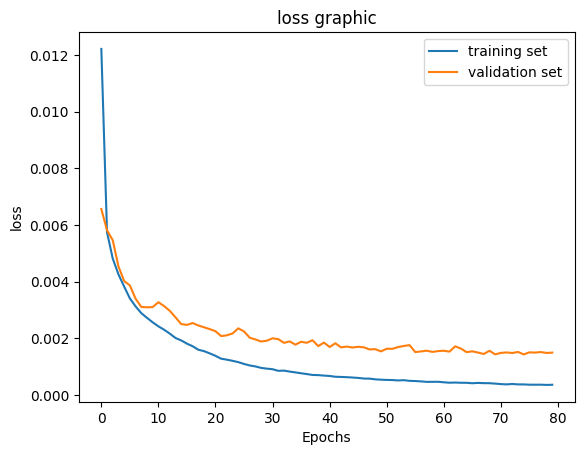

In [59]:
output_metrics(history, "loss")

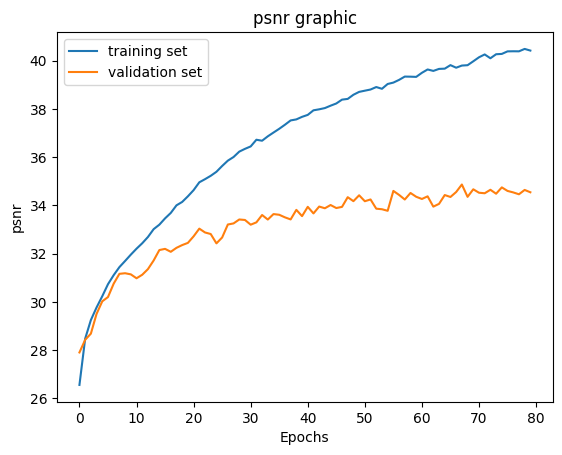

In [60]:
output_metrics(history, "psnr")

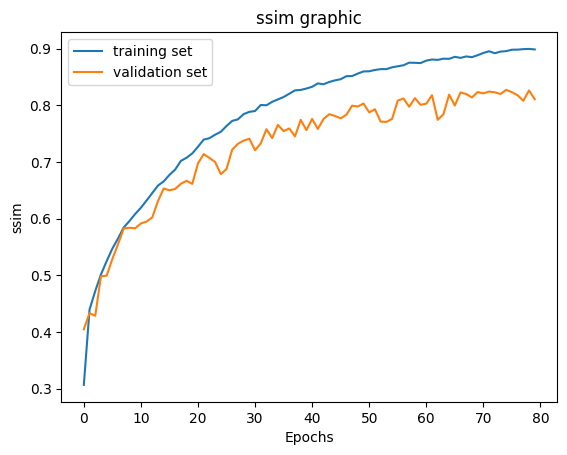

In [61]:
output_metrics(history, "ssim")

In [65]:
def output_images(dataset, model, limit):
    for i, (x, y, z) in enumerate(dataset):
        L = x.unsqueeze(0).to(device)
        emb = z.unsqueeze(0).to(device)
        l_channel = x.permute(1, 2, 0).squeeze(2).cpu().numpy()
        ab_channels = y.permute(1, 2, 0).cpu().numpy()
    
        a_channel = ab_channels[:, :, 0]
        b_channel = ab_channels[:, :, 1]
    
        # print(l_channel.shape, a_channel.shape, b_channel.shape)
        lab_image = np.stack([l_channel*100, a_channel*128, b_channel*128], axis=-1).astype(np.float64)
        rgb_image = lab2rgb(lab_image)

        # print(z.shape)
        # emb = t_model(z)
        res = model.predict(L, emb)
        # print(L.shape)

        if len(res.shape) > 3:
            res = res.squeeze(0)
        
        plt.subplot(1, 3, 1)
        plt.imshow(res)
        plt.title("Prediction")    
        
        plt.subplot(1, 3, 2)
        plt.imshow(l_channel, cmap="gray")
        plt.title("Grayscaled")
    
        plt.subplot(1, 3, 3)
        plt.imshow(rgb_image)
        plt.title("Original")
        
        plt.show()
    
        if i+1 >= limit:
            break 



In [62]:
torch.save(model.state_dict(), "history_in_color_v2_0.pt")
# torch.save(pretrained_model.state_dict(), "embaddings_v14.pt")

In [69]:
t_model = Autoencoder()
t_model.to(device)
link = "/kaggle/working/history_in_color_v14.pt"
t_model.load_state_dict(torch.load(link, map_location=device))

<ipython-input-69-518ed989d601>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  t_model.load_state_dict(torch.load(link, map_location=device))


<All keys matched successfully>

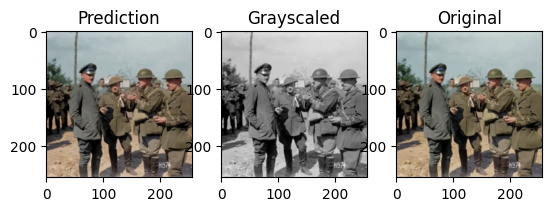

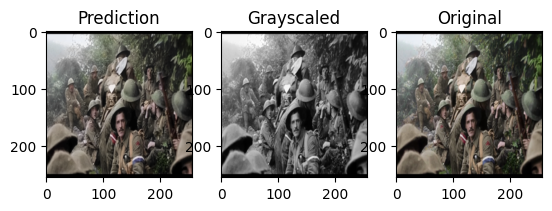

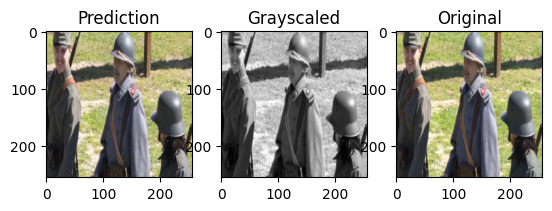

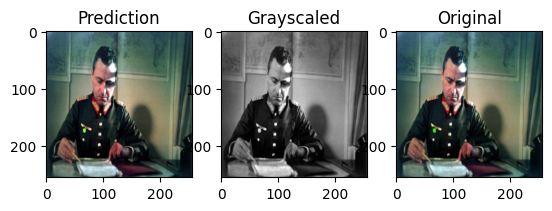

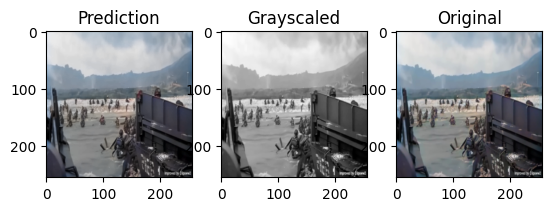

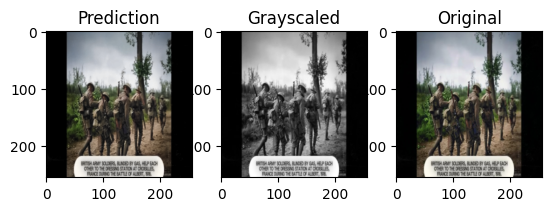

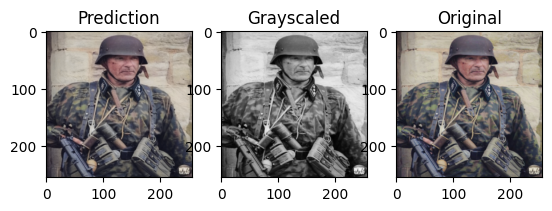

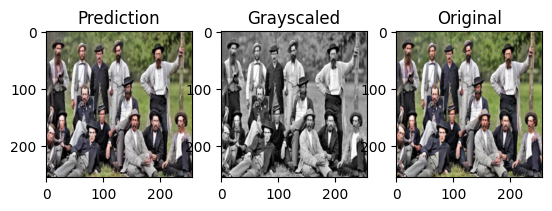

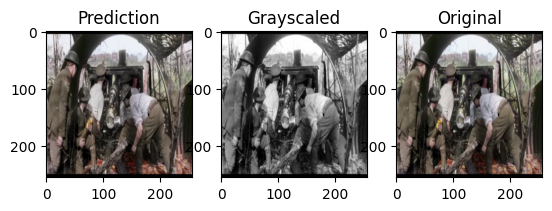

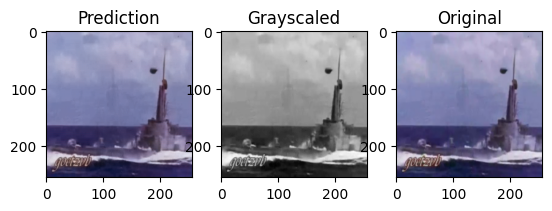

In [66]:
output_images(train_data, model,  10)

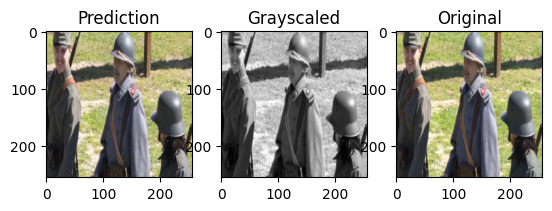

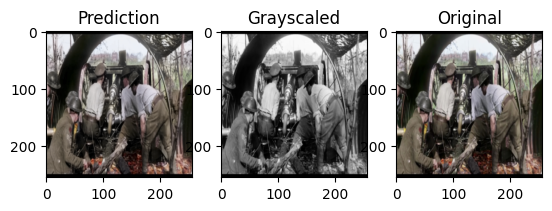

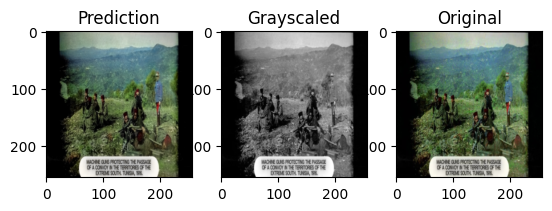

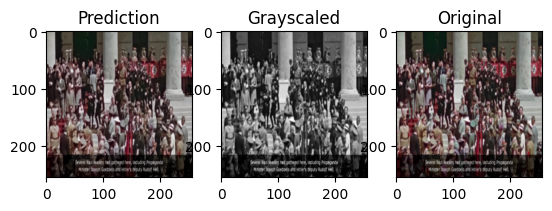

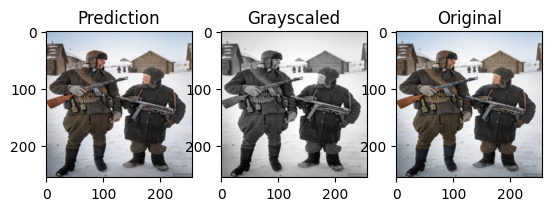

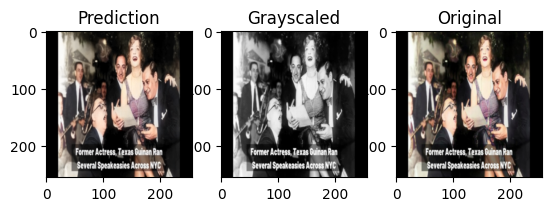

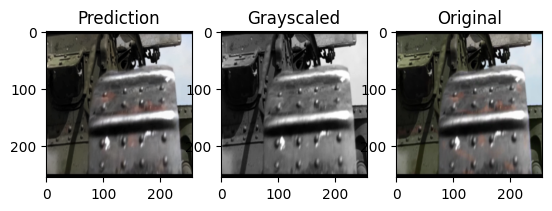

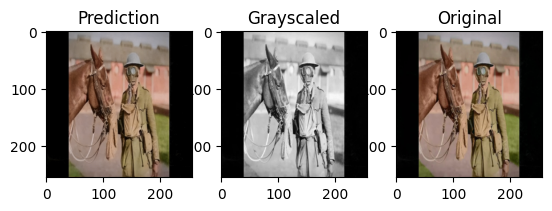

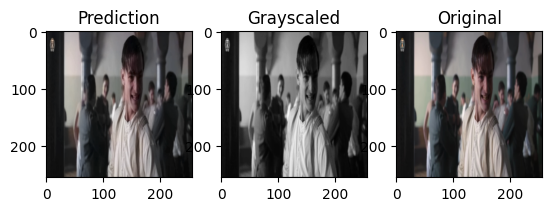

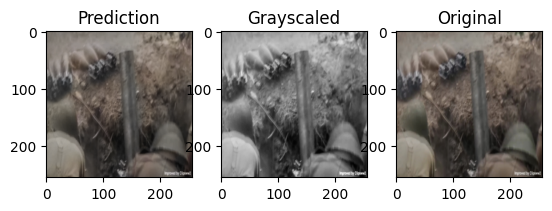

In [67]:
output_images(val_data, model,  10)

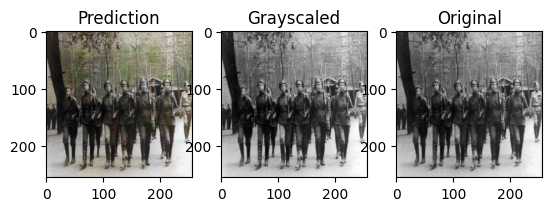

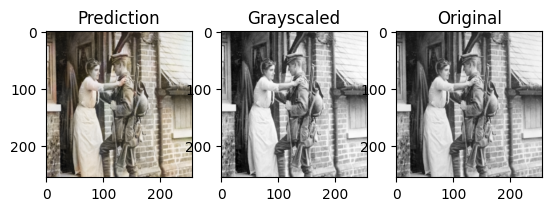

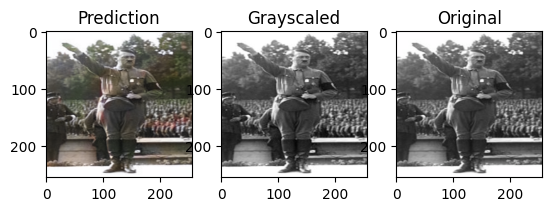

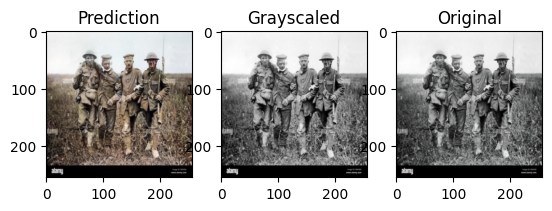

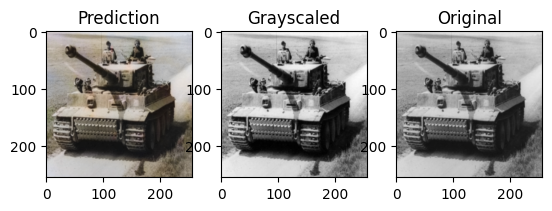

...

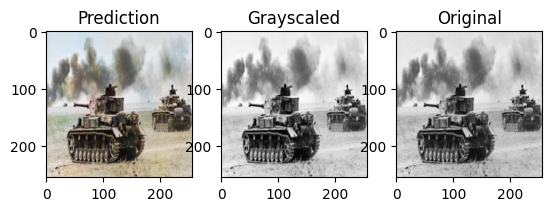

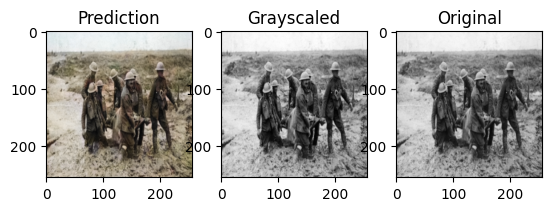

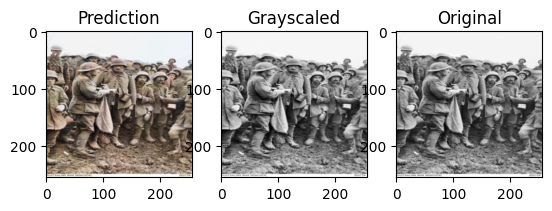

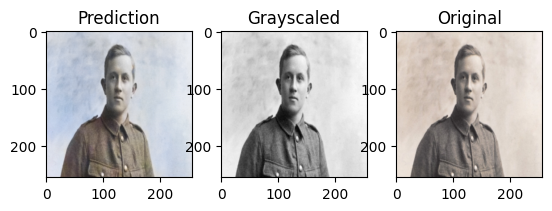

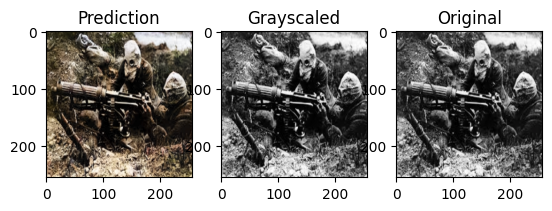

In [68]:
output_images(test_data, model,  len(test_data))

In [ ]:
class SEBlock(nn.Module):
    def __init__(self, C, r=16):
        super().__init__()

        self.aap = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()

        self.linear1 = nn.Linear(C, C//r)
        self.linear2 = nn.Linear(C//r, C)

        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        out = self.aap(x)
        out = self.flatten(out)

        out = self.relu(self.linear1(out))
        out = self.sigmoid(self.linear2(out))

        out = out[:, :, None, None]

        res = out * x

        return res 


class StudentModel(nn.Module):
    def __init__(self, inputs=1, outputs=2):
        super().__init__()

        
        self.conv1 = nn.Conv2d(inputs, 32, kernel_size=4, stride=2, padding=1)
        self.bnorm1 = nn.BatchNorm2d(32)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.bnorm2 = nn.BatchNorm2d(64)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.bnorm3 = nn.BatchNorm2d(128)

        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)
        self.bnorm4 = nn.BatchNorm2d(256)

        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=2, dilation=2)
        self.bnorm5 = nn.BatchNorm2d(512)

        self.t_conv1 = nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1)
        self.t_bnorm1 = nn.BatchNorm2d(256)

        self.t_conv2 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.t_bnorm2 = nn.BatchNorm2d(128)

        self.t_conv3 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.t_bnorm3 = nn.BatchNorm2d(64)

        self.t_conv4 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.t_bnorm4 = nn.BatchNorm2d(32)

        

        self.output = nn.Conv2d(32, 2, kernel_size=3, padding=1)
        self.tanh = nn.Tanh()


    def forward(self, x, return_latent=False):
        out = F.leaky_relu(self.bnorm1(self.conv1(x)))
        out = F.leaky_relu(self.bnorm2(self.conv2(out)))
        out = F.leaky_relu(self.bnorm3(self.conv3(out)))
        out = F.leaky_relu(self.bnorm4(self.conv4(out)))
        out = F.leaky_relu(self.bnorm5(self.conv5(out)))

        if return_latent == True:
            return out

        out = F.leaky_relu(self.t_bnorm1(self.t_conv1(out)))
        out = F.leaky_relu(self.t_bnorm2(self.t_conv2(out)))
        out = F.leaky_relu(self.t_bnorm3(self.t_conv3(out)))
        out = F.leaky_relu(self.t_bnorm4(self.t_conv4(out)))

        res = self.tanh(self.output(out))

        return res

    def predict(self, l_channel):
        self.eval()

        with torch.no_grad():
            ab_channels = self.forward(l_channel)

        l_channel = l_channel.squeeze(0).squeeze(0).cpu().numpy()
        ab_channels = ab_channels.squeeze(0).permute(1, 2, 0).cpu().numpy()

        a_channel = ab_channels[:, :, 0] 
        b_channel = ab_channels[:, :, 1] 

        l_channel = np.clip(l_channel*100, 0, 100).astype(np.uint8)
        a_channel = np.clip(a_channel*128, -128, 127).astype(np.int8)
        b_channel = np.clip(b_channel*128, -128, 127).astype(np.int8)

        lab_image = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float64)

        rgb_image = lab2rgb(lab_image)
        rgb_image = np.clip(rgb_image*255, 0, 255).astype(np.uint8)  
        # rgb_image = np.clip(rgb_image, 0, 1).astype(np.uint8)  
        return rgb_image
        
        
student_model = StudentModel()
student_model.to(device)
        

In [ ]:
block = SEBlock(32)
tensor = torch.rand(1, 32, 256, 256)
out = block(tensor)
out.shape

In [ ]:
# model = StudentModel()
tensor = torch.rand(1, 1, 256, 256).to(device)
res = student_model(tensor)
res.shape

In [ ]:
summary(student_model, input_size=(1, 256, 256))

In [ ]:
# model = StudentModel()
tensor = torch.rand(1, 1, 256, 256).to(device)
res = student_model.predict(tensor)
res.shape

In [ ]:
def upd_distillation_train(student_model, teacher_model, loss_fn, dist_fn, optimizer, train_dl, val_dl, epochs, device, psnr, ssim,
                          alpha=0.5, beta=0.5):
    history = {
        "train_loss": [],
        "train_psnr": [], 
        "train_ssim": [],

        "val_loss": [],
        "val_psnr": [],
        "val_ssim": []
    }

    for epoch in range(epochs):

        # pretrained_model.eval()
        teacher_model.eval()
        student_model.train()

        train_loss = 0.0
        train_psnr = 0.0
        train_ssim = 0.0

        for x, y, z in tqdm(train_dl):
            x = x.to(device)
            y = y.to(device)
            emd = z.to(device)

            with torch.no_grad():
                # emd = pretrained_model(z)
                teacher_latent = teacher_model(x, emd, return_latent=True)

            optimizer.zero_grad()
            student_preds = student_model(x)
            student_latent = student_model(x, return_latent=True)

            dist_loss = dist_fn(teacher_latent, student_latent)
            struct_loss = loss_fn(student_preds, y)

            loss = dist_loss * alpha + struct_loss * beta 
            train_loss += loss.item()
            
            loss.backward()
            optimizer.step()

            t_psnr = psnr(student_preds.detach().cpu().numpy(), y.detach().cpu().numpy())
            train_psnr += t_psnr.item()

            preds_np = student_preds.cpu().detach().numpy()
            y_np = y.cpu().detach().numpy()

            if preds_np.shape[1] > 1:  
                preds_np = preds_np.mean(axis=1) 
                y_np = y_np.mean(axis=1)

            t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=7, data_range=2.0)
            train_ssim += t_ssim

        total_train_loss = train_loss / len(train_dl)
        total_train_psnr = train_psnr / len(train_dl)
        total_train_ssim = train_ssim / len(train_dl)

        student_model.eval()
        val_loss = 0.0
        val_psnr = 0.0
        val_ssim = 0.0

        with torch.no_grad():
            for x, y, _ in tqdm(val_dl):
                x = x.to(device)
                y = y.to(device)

                student_preds = student_model(x)
                loss = loss_fn(student_preds, y)
                val_loss += loss.item()

                t_psnr = psnr(student_preds.detach().cpu().numpy(), y.detach().cpu().numpy())
                val_psnr += t_psnr.item()

                preds_np = student_preds.cpu().detach().numpy()
                true_np = y.cpu().detach().numpy()

                if preds_np.shape[1] > 1:
                    preds_np = preds_np.mean(axis=1)
                    true_np = true_np.mean(axis=1)

                t_ssim = ssim(preds_np.squeeze(), true_np.squeeze(), win_size=7, data_range=2.0)
                val_ssim += t_ssim

        total_val_loss = val_loss / len(val_dl)
        total_val_psnr = val_psnr / len(val_dl)
        total_val_ssim = val_ssim / len(val_dl)

        history["train_loss"].append(total_train_loss)
        history["train_psnr"].append(total_train_psnr)
        history["train_ssim"].append(total_train_ssim)

        history["val_loss"].append(total_val_loss)
        history["val_psnr"].append(total_val_psnr)
        history["val_ssim"].append(total_val_ssim)

        print(
            f"Epoch: {epoch+1}; "
            f"train_loss: {total_train_loss:.4f}; train_psnr: {total_train_psnr:.4f}; train_ssim: {total_train_ssim:.4f}; "
            f"val_loss: {total_val_loss:.4f}; val_psnr: {total_val_psnr:.4f}; val_ssim: {total_val_ssim:.4f}"
        )

    return history
 
                

In [ ]:
# teacher_model = Autoencoder()
# teacher_model.to(device)

# student_model = StudentModel()
# student_model.to(device)

In [ ]:
loss_fn = nn.MSELoss()
dist_fn = nn.MSELoss()

optimizer = Adam(student_model.parameters(), lr=1e-3)

In [ ]:
history = upd_distillation_train(student_model, teacher_model, loss_fn, dist_fn, optimizer, train_dl, val_dl, 35, device, psnr, ssim,
                          alpha=0.5, beta=0.5)

In [ ]:
def upd_output_images(dataset, model, limit):
    for i, (x, y, _) in enumerate(dataset):
        L = x.unsqueeze(0).to(device)
        # emb = z.unsqueeze(0).to(device)
        l_channel = x.permute(1, 2, 0).squeeze(2).cpu().numpy()
        ab_channels = y.permute(1, 2, 0).cpu().numpy()
    
        a_channel = ab_channels[:, :, 0]
        b_channel = ab_channels[:, :, 1]
    
        # print(l_channel.shape, a_channel.shape, b_channel.shape)
        lab_image = np.stack([l_channel*100, a_channel*128, b_channel*128], axis=-1).astype(np.float64)
        rgb_image = lab2rgb(lab_image)

        # print(z.shape)
        # emb = t_model(z)
        res = model.predict(L)
        # print(L.shape)

        if len(res.shape) > 3:
            res = res.squeeze(0)
        
        plt.subplot(1, 3, 1)
        plt.imshow(res)
        plt.title("Prediction")    
        
        plt.subplot(1, 3, 2)
        plt.imshow(l_channel, cmap="gray")
        plt.title("Grayscaled")
    
        plt.subplot(1, 3, 3)
        plt.imshow(rgb_image)
        plt.title("Original")
        
        plt.show()
    
        if i+1 >= limit:
            break 



In [ ]:
upd_output_images(train_data, student_model, 10)

In [ ]:
upd_output_images(val_data, student_model, 10)

In [ ]:
upd_output_images(test_data, student_model, len(test_data))

In [ ]:
torch.save(model.state_dict(), "history_in_color_v13.pt")